# Wokflow con Full Bayesiana 

##  Big Picture

Se muestra el workflow con la Bayesian Optimization diseñada para que LightGBM maximice la ganancia en pesos argentinos
<br> En la Primera Competencia se maximizo la metrica global ROC AUC,  ahora pasamos a la metrica real que llamamos ganancia y que solo se concentra en los  11000 registros con mayor probabilidad de  {"BAJA+1","BAJA+2"}


Intencionalmente este notebook es un *semi-esqueleto*  al que usted deberá completar reutilizando código que ya generó para la Primera Competencia y nuevo código que resuelva las problemáticas presentes en esta competencia.

## Inicializacion

In [1]:
# limpio la memoria
Sys.time()
rm(list=ls(all.names=TRUE)) # remove all objects
gc(full=TRUE, verbose=FALSE) # garbage collection

[1] "2025-11-11 01:59:54 UTC"

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,657967,35.2,1454631,77.7,1230802,65.8
Vcells,1221279,9.4,8388608,64.0,1975151,15.1


In [2]:
PARAM <- list()
PARAM$experimento <- "005"
PARAM$semilla_primigenia <- 100003

In [3]:
setwd("/content/buckets/b1/exp")
experimento_folder <- PARAM$experimento
dir.create(experimento_folder, showWarnings=FALSE)
setwd( paste0("/content/buckets/b1/exp/", experimento_folder ))

## Preprocesamiento

### Generacion de la clase_ternaria

In [4]:
Sys.time()
require( "data.table" )

# leo el dataset
dataset <- fread("~/buckets/b1/datasets/competencia_02_crudo.csv.gz" )

# calculo el periodo0 consecutivo
dsimple <- dataset[, list(
  "pos" = .I,
  numero_de_cliente,
  periodo0 = as.integer(foto_mes/100)*12 +  foto_mes%%100 )
]


# ordeno
setorder( dsimple, numero_de_cliente, periodo0 )

# calculo topes
periodo_ultimo <- dsimple[, max(periodo0) ]
periodo_anteultimo <- periodo_ultimo - 1


# calculo los leads de orden 1 y 2
dsimple[, c("periodo1", "periodo2") :=
  shift(periodo0, n=1:2, fill=NA, type="lead"),  numero_de_cliente
]

# assign most common class values = "CONTINUA"
dsimple[ periodo0 < periodo_anteultimo, clase_ternaria := "CONTINUA" ]

# calculo BAJA+1
dsimple[ periodo0 < periodo_ultimo &
  ( is.na(periodo1) | periodo0 + 1 < periodo1 ),
  clase_ternaria := "BAJA+1"
]

# calculo BAJA+2
dsimple[ periodo0 < periodo_anteultimo & (periodo0+1 == periodo1 )
  & ( is.na(periodo2) | periodo0 + 2 < periodo2 ),
  clase_ternaria := "BAJA+2"
]

# pego el resultado en el dataset original y grabo
setorder( dsimple, pos )
dataset[, clase_ternaria := dsimple$clase_ternaria ]

rm(dsimple)
gc()
Sys.time()

[1] "2025-11-11 01:59:55 UTC"

Loading required package: data.table



,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,766808,41.0,1454631,77.7,1454631,77.7
Vcells,722144077,5509.6,1017394155,7762.2,845997361,6454.5


[1] "2025-11-11 02:00:30 UTC"

In [5]:
setorder( dataset, foto_mes, clase_ternaria, numero_de_cliente)
dataset[, .N, list(foto_mes, clase_ternaria)]

foto_mes,clase_ternaria,N
<int>,<chr>,<int>
201901,BAJA+1,645
201901,BAJA+2,729
201901,CONTINUA,122899
201902,BAJA+1,733
201902,BAJA+2,707
201902,CONTINUA,123961
201903,BAJA+1,708
201903,BAJA+2,751
201903,CONTINUA,124508


### Eliminacion de Features

Completar a gusto LUEGO de realizar un analisis exploratorio de datos.
<br> No necesariamente en esta Segunda Competencia conviele eliminar los mismos campos que en la Primera ...

In [6]:
nrow(dataset)
ncol(dataset)

[1] 4717958

[1] 155

In [7]:
# elimino variables con picos raros

dataset[, mprestamos_personales := NULL ]
dataset[, cprestamos_personales := NULL ]
dataset[, Master_mfinanciacion_limite := NULL ]
dataset[, Visa_mfinanciacion_limite := NULL ]

Sys.time()

[1] "2025-11-11 02:00:31 UTC"


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


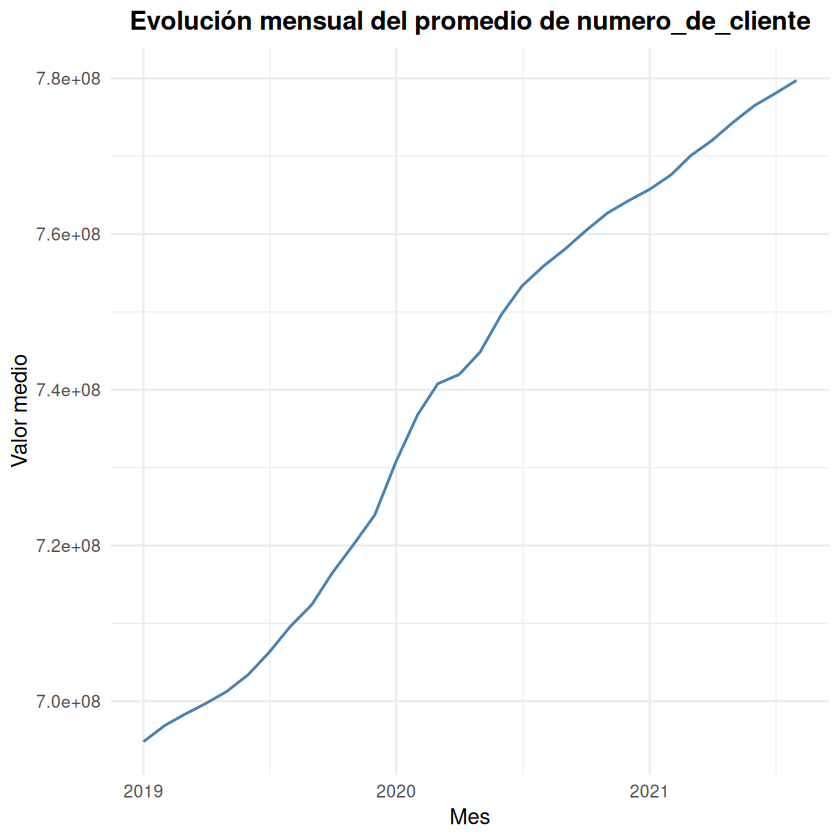

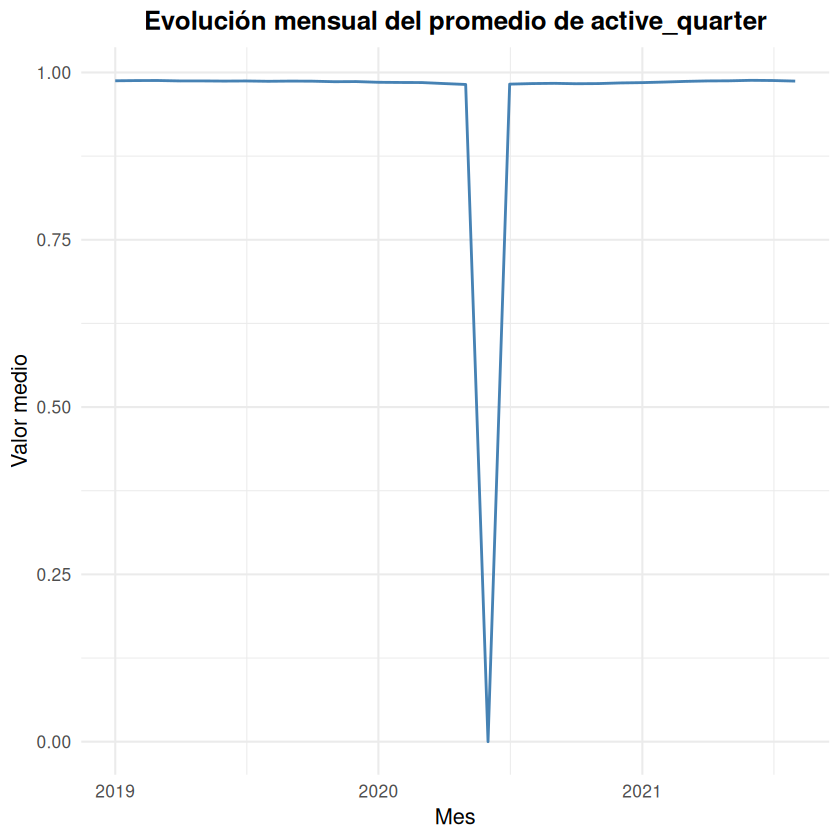

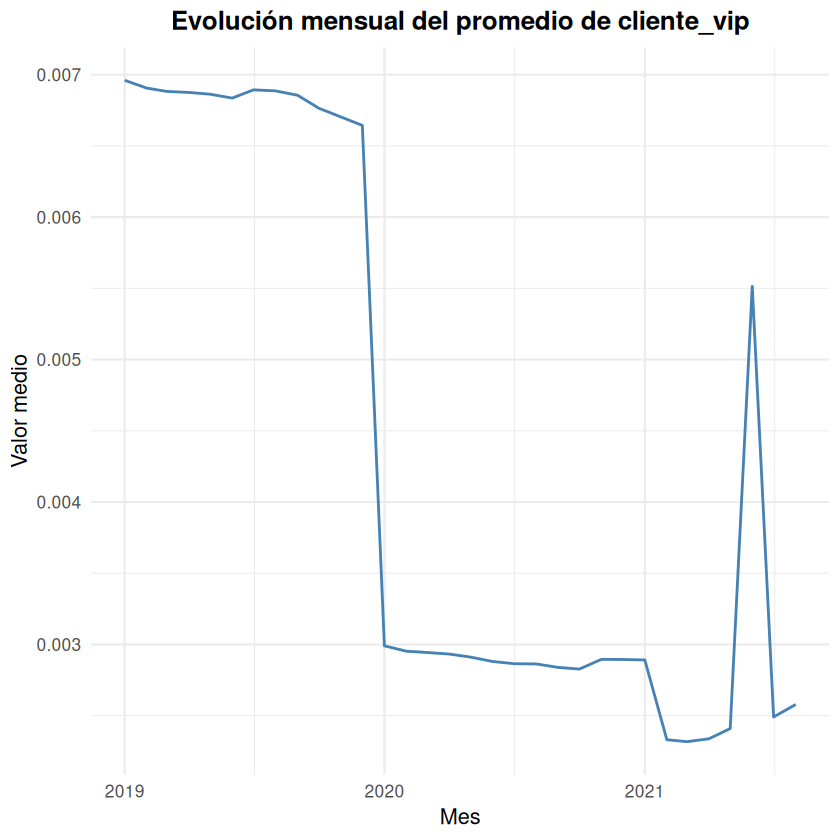

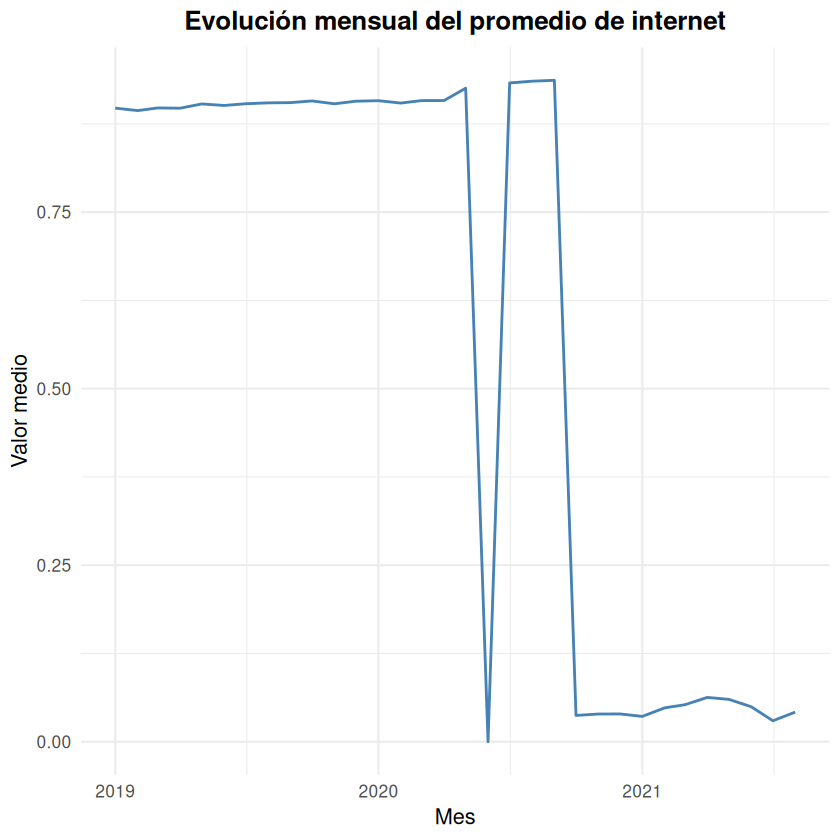

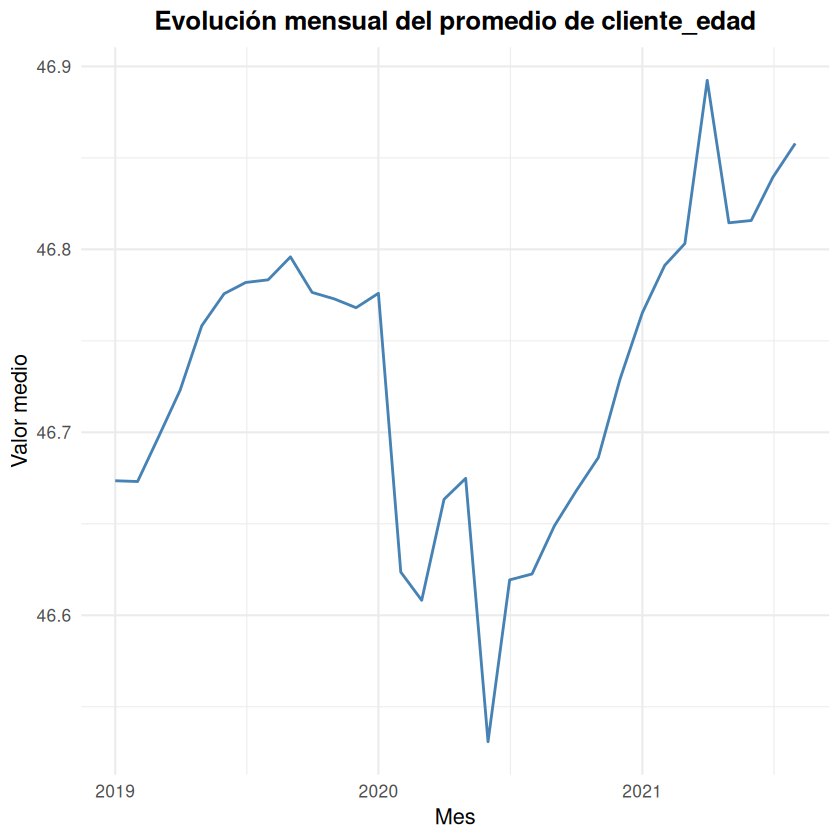

...

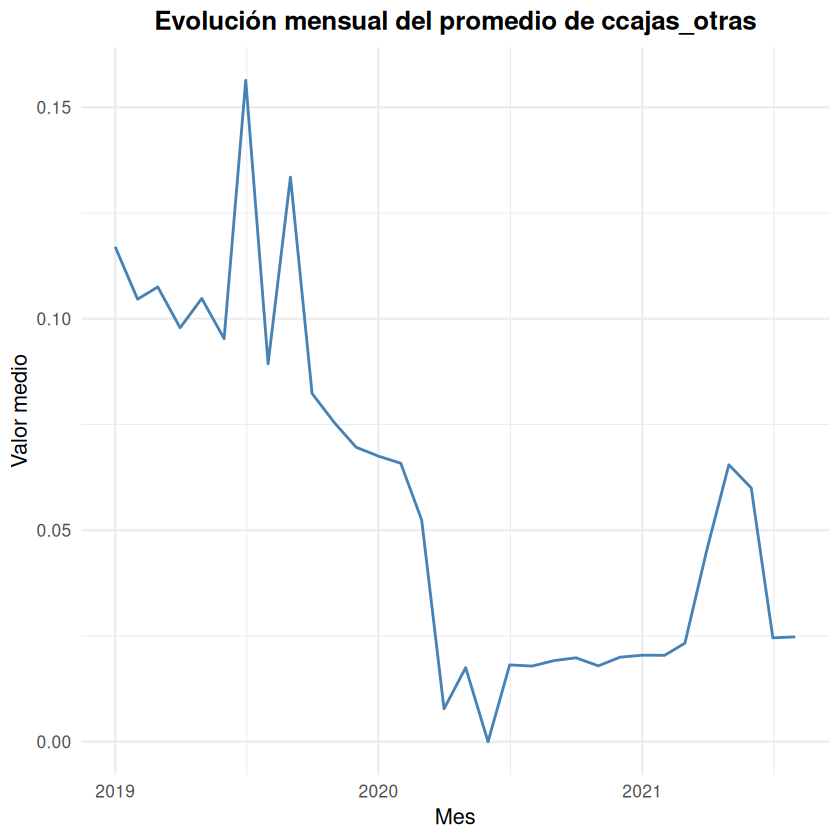

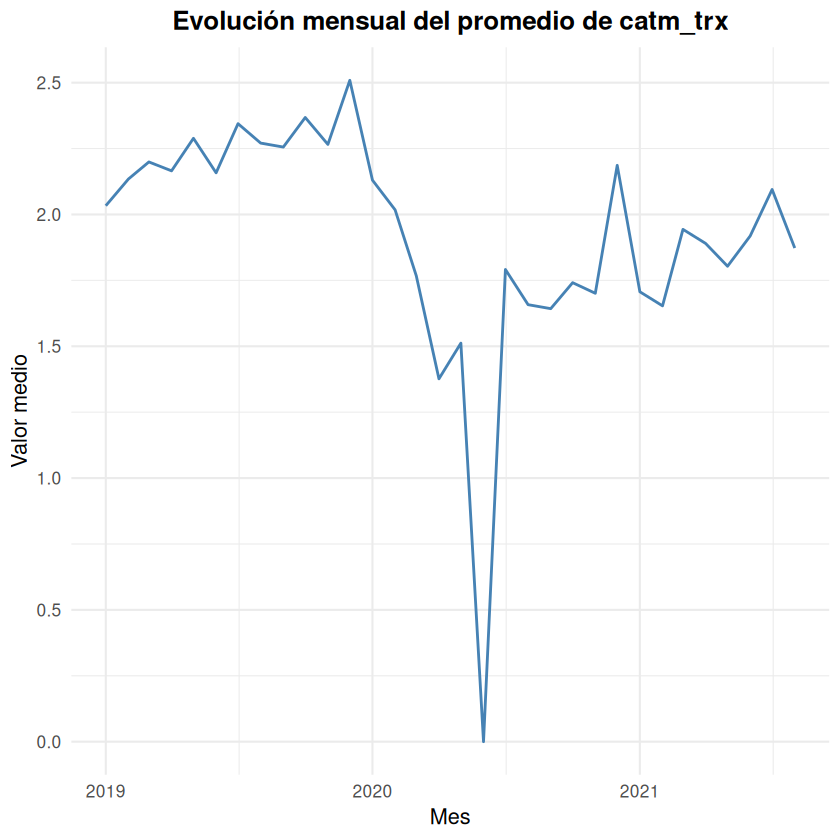

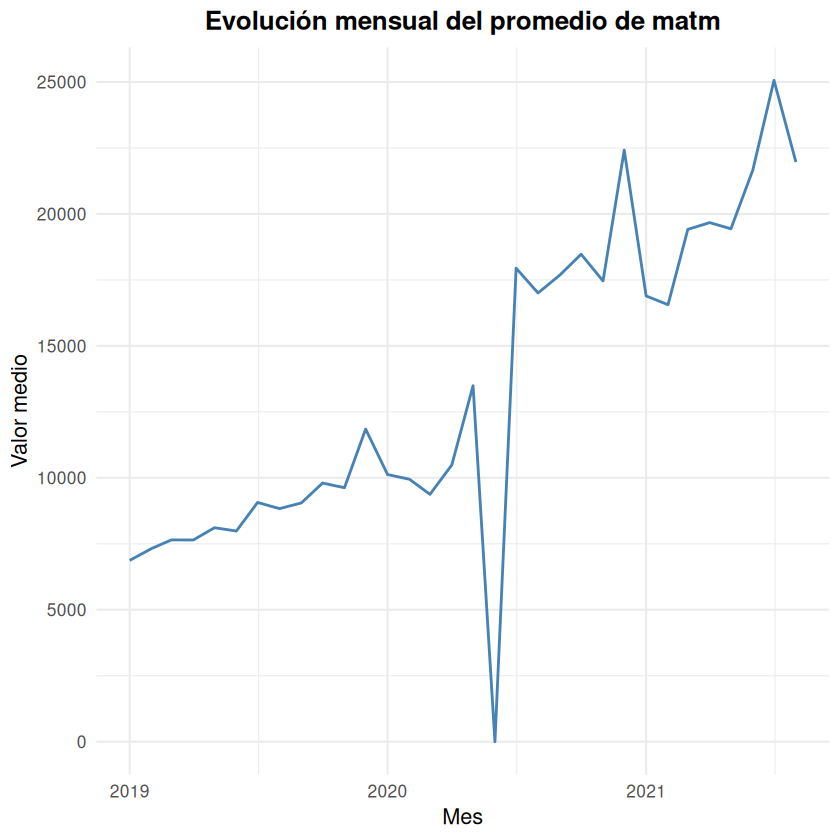

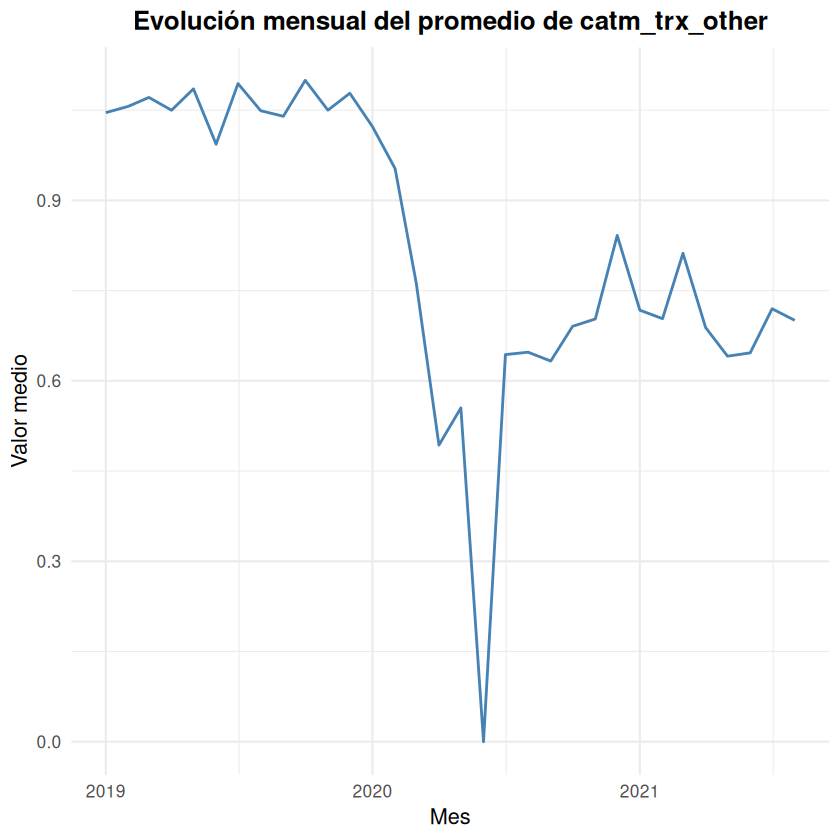

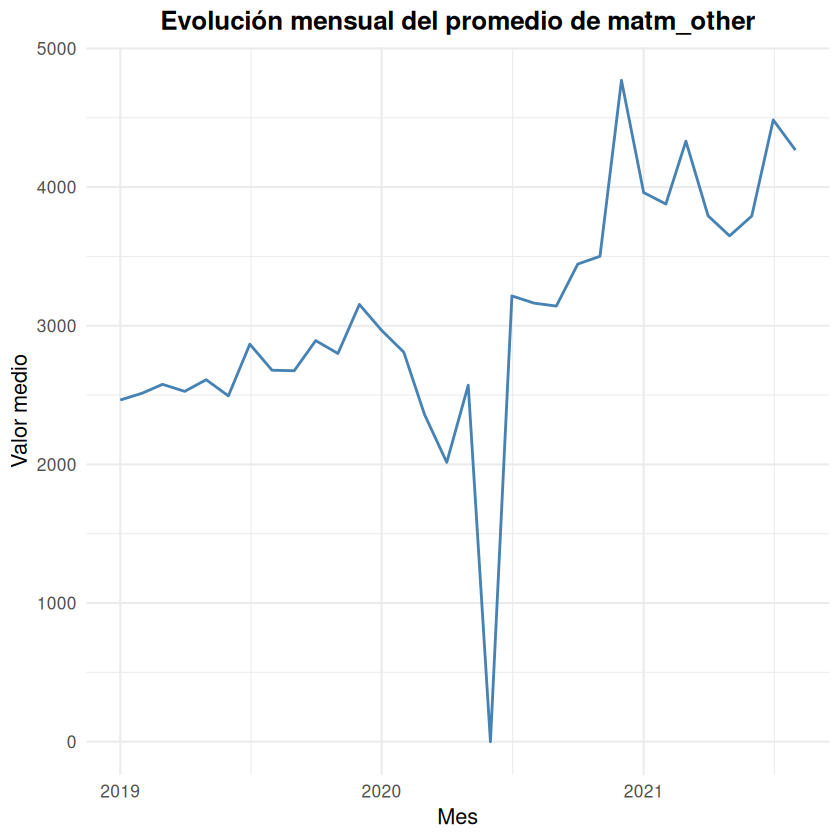

Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_line()`).”


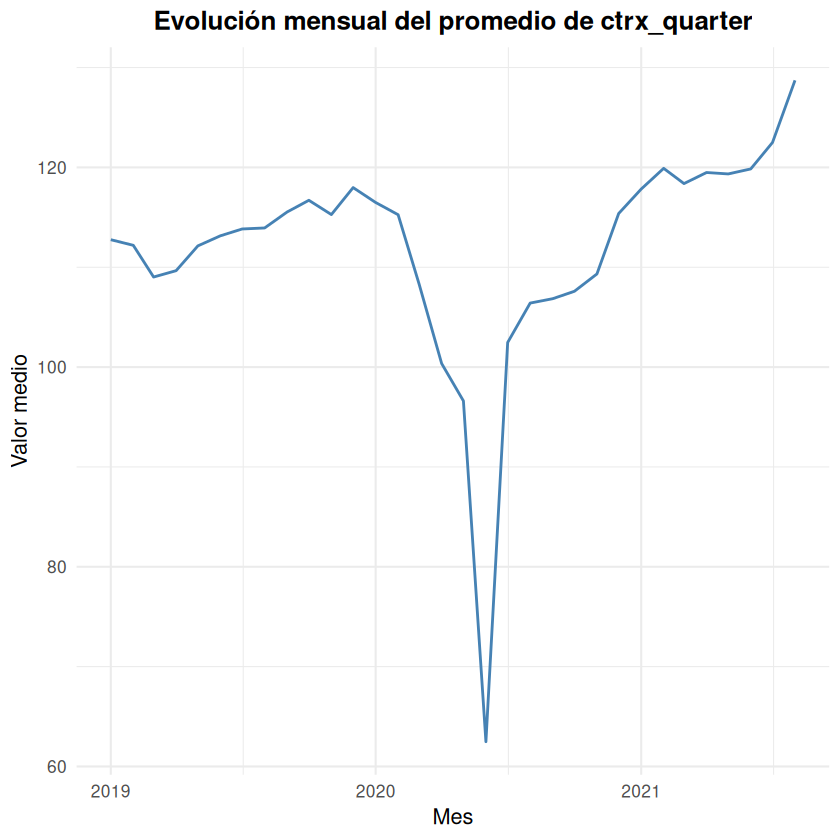

Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_line()`).”


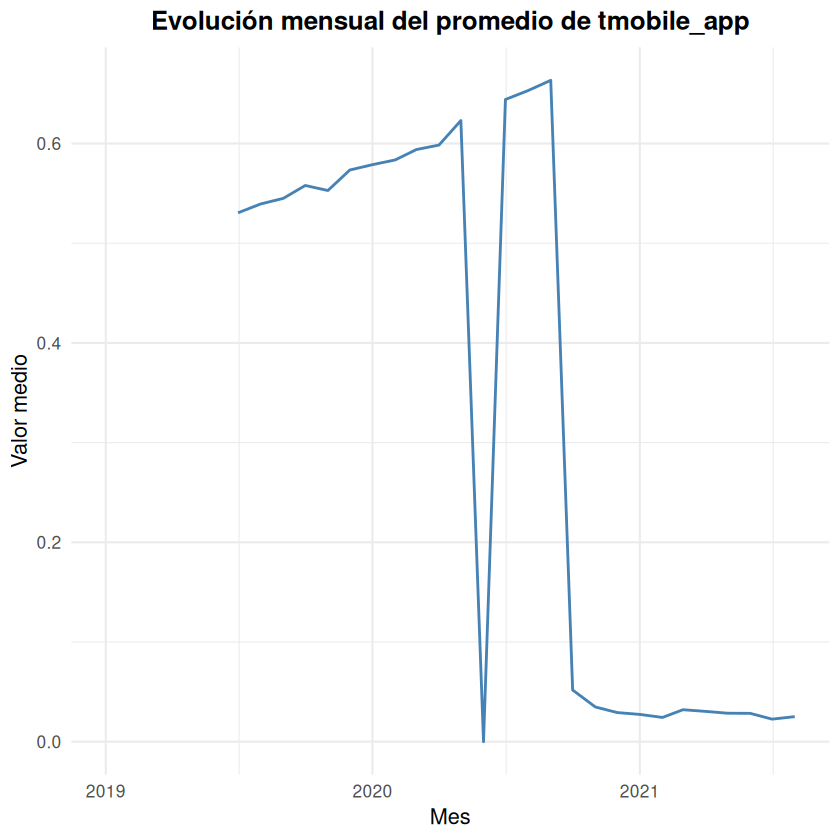

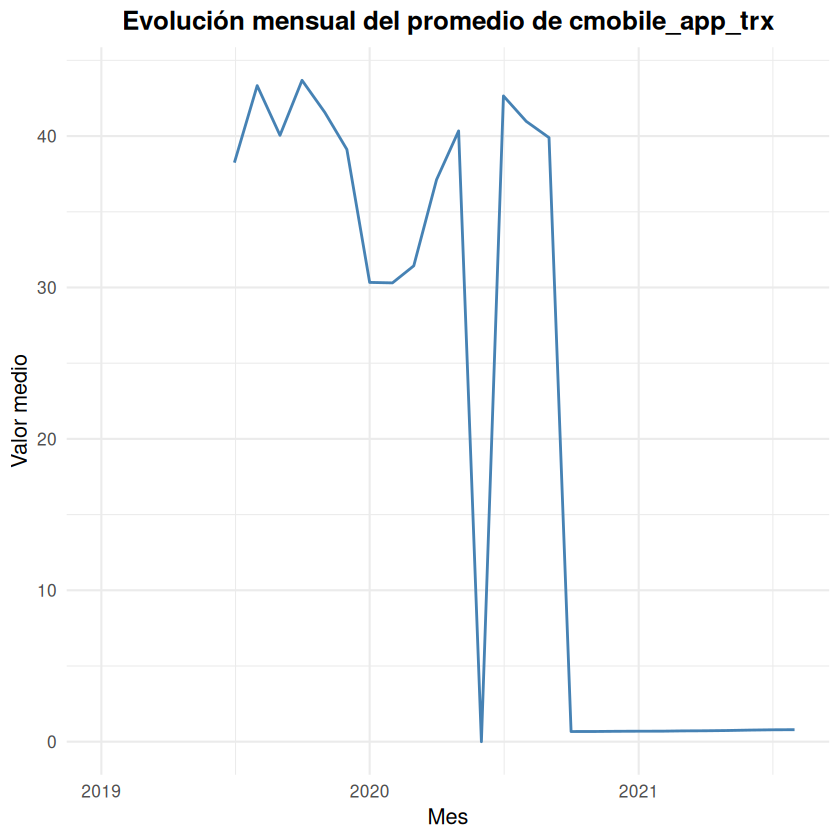

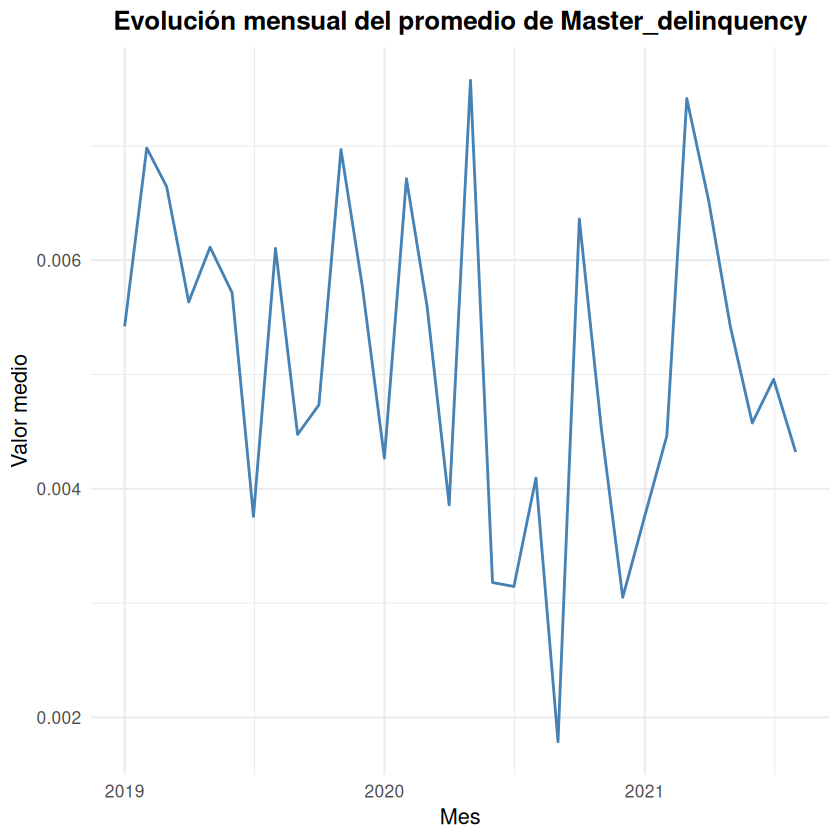

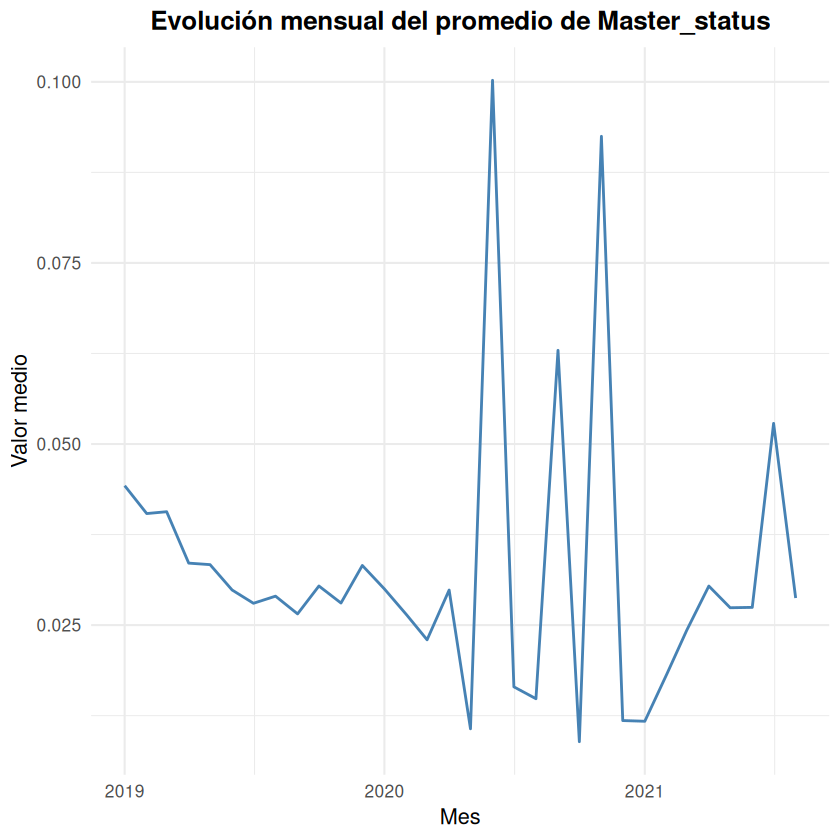

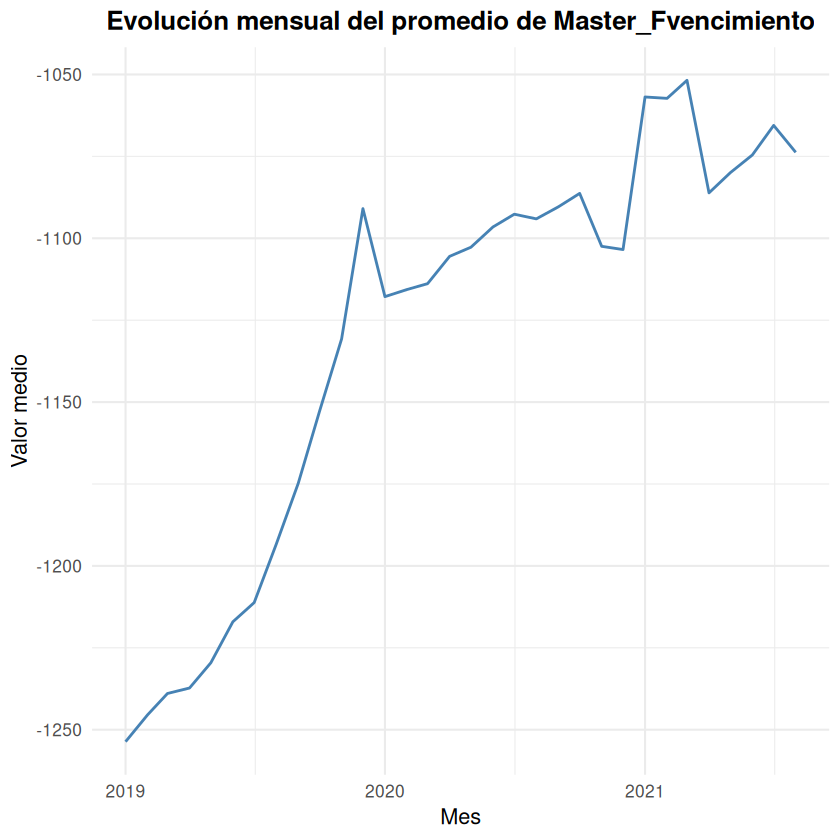

...

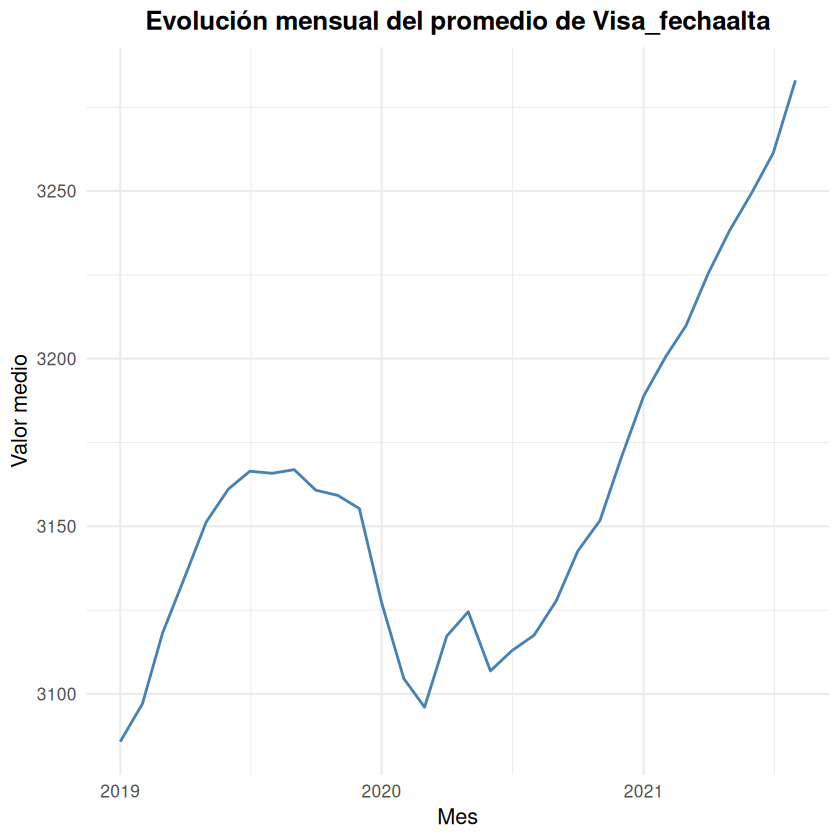

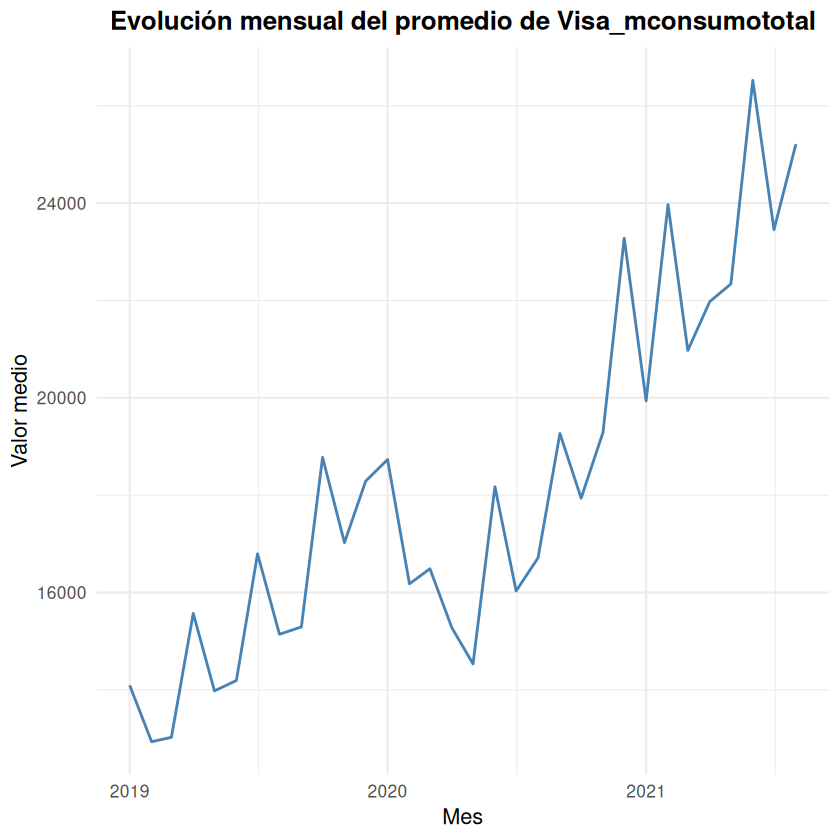

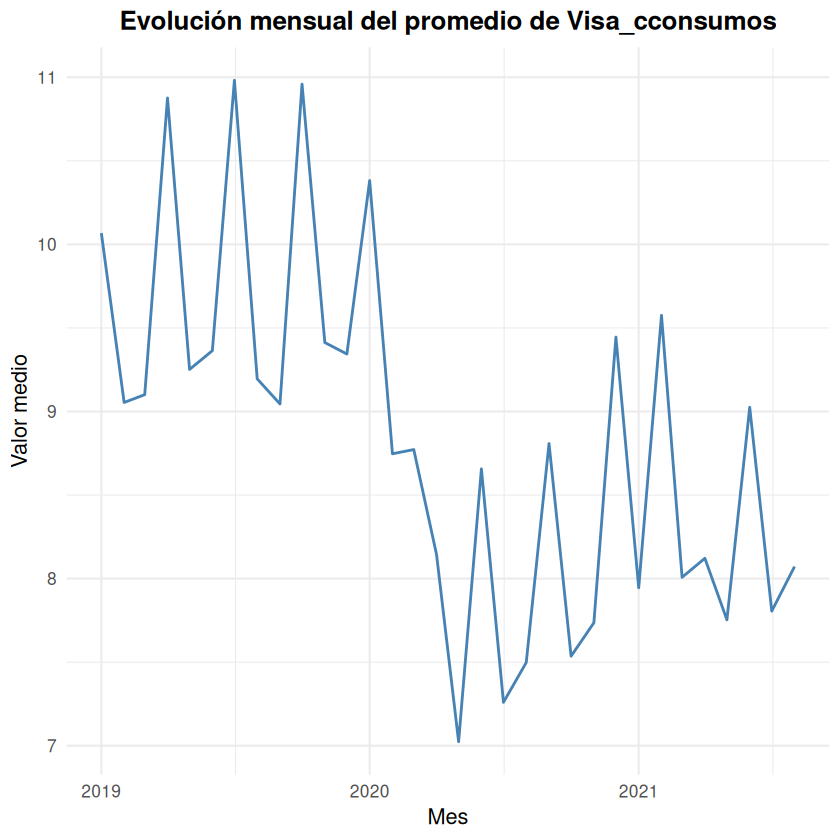

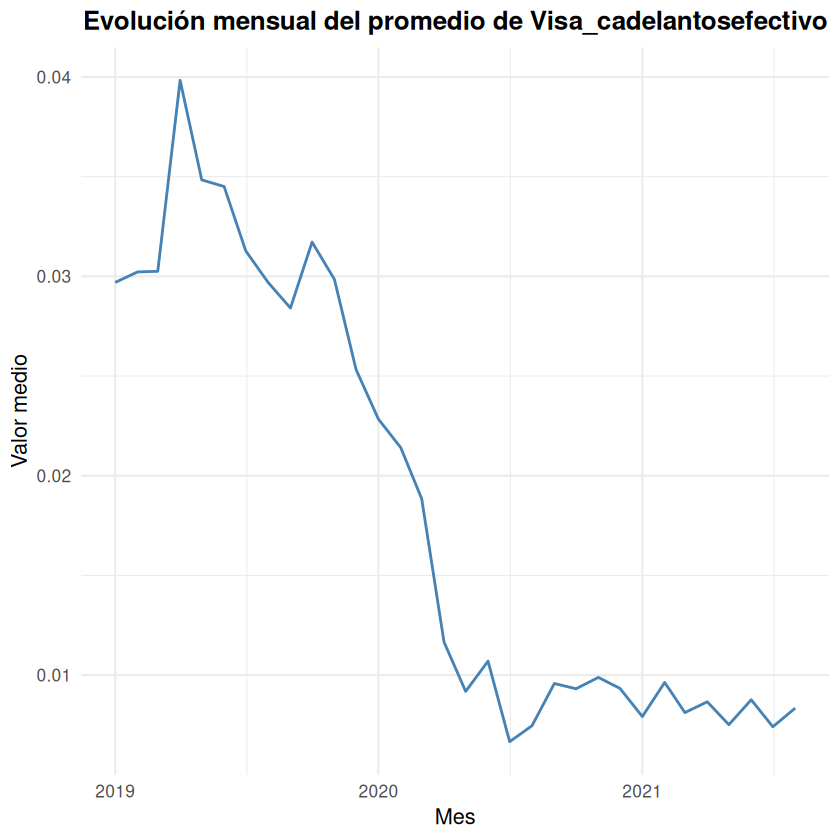

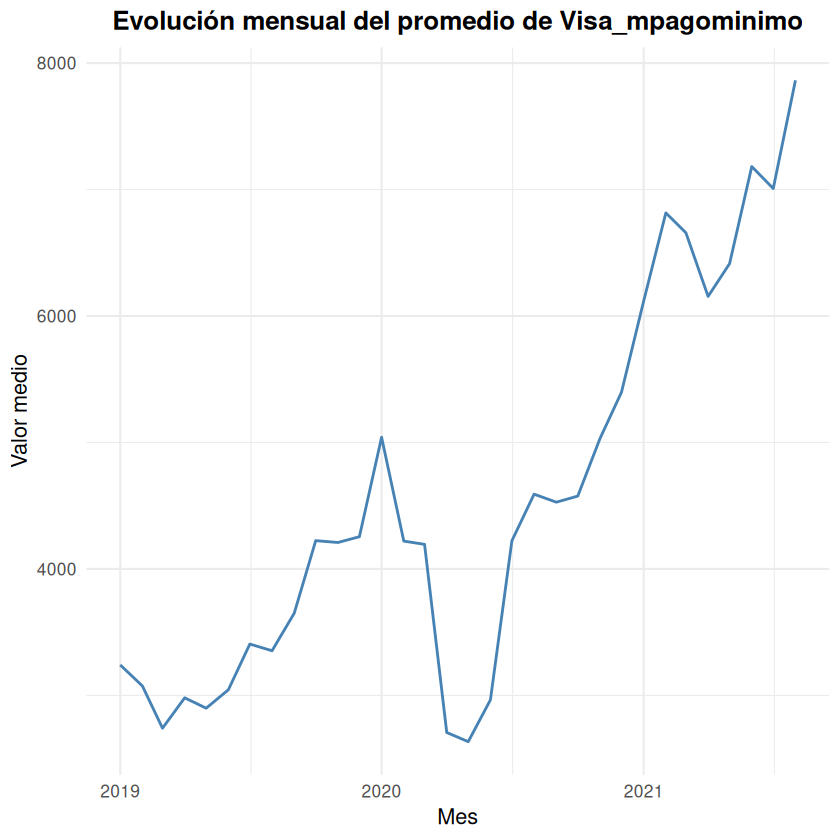

In [8]:
library(dplyr)
library(tidyr)
library(ggplot2)

# --- 1️⃣ Seleccionar variables numéricas + foto_mes ---
num_vars <- dataset %>%
  select(where(is.numeric), foto_mes)

# --- 2️⃣ Calcular el promedio por mes ---
mean_by_month <- num_vars %>%
  group_by(foto_mes) %>%
  summarise(across(where(is.numeric), ~mean(.x, na.rm = TRUE), .names = "{.col}")) %>%
  ungroup()

# --- 3️⃣ Reorganizar en formato largo ---
mean_long <- mean_by_month %>%
  pivot_longer(cols = -foto_mes,
               names_to = "variable",
               values_to = "mean_value")

# --- 4️⃣ Convertir foto_mes a fecha real (YYYYMM → Date) ---
mean_long <- mean_long %>%
  mutate(fecha = as.Date(paste0(foto_mes, "01"), format = "%Y%m%d"))

# --- 5️⃣ Generar un gráfico por variable ---
variables <- unique(mean_long$variable)

for (v in variables) {
  data_var <- filter(mean_long, variable == v)
  
  p <- ggplot(data_var, aes(x = fecha, y = mean_value)) +
    geom_line(color = "steelblue", size = 0.8) +
    labs(
      title = paste("Evolución mensual del promedio de", v),
      x = "Mes",
      y = "Valor medio"
    ) +
    theme_minimal(base_size = 13) +
    theme(plot.title = element_text(face = "bold", hjust = 0.5))
  
  print(p)  # 👈 Esto imprime cada gráfico en la consola (uno por vez)
}


In [9]:
library(dplyr)
library(tidyr)

# Identificar columnas numéricas (excluyendo foto_mes)
numeric_cols <- names(select(dataset, where(is.numeric)))
if ("foto_mes" %in% numeric_cols) numeric_cols <- setdiff(numeric_cols, "foto_mes")

# Contar NAs antes
na_antes <- sum(is.na(dataset))

# Reemplazar ceros masivos por NA
dataset <- dataset %>%
  group_by(foto_mes) %>%
  mutate(across(all_of(numeric_cols), ~ {
    if (sum(abs(.x), na.rm = TRUE) == 0) replace(.x, .x == 0, NA_real_) else .x
  })) %>%
  ungroup()

# Contar NAs después
na_despues <- sum(is.na(dataset))

# Mostrar resumen
cat("NAs antes:", na_antes, "\n")
cat("NAs después:", na_despues, "\n")
cat("Nuevos NAs agregados:", na_despues - na_antes, "\n")


NAs antes: 50448153 
NAs después: 64610228 
Nuevos NAs agregados: 14162075 


### Data Quality

Se deben reparar los atributos del dataset que para un cierto mes TODOS sus valores son cero.
<br> Relevar en forma muy minuciosa en el dataset cuales son los  <atributo,mes> que estan dañados.
<br> Algunas alternativas de solución son:
* No hacer absolutamente nada, dejar el valor 0 tal cual está, a sabiendas que es incorrecto
* Reemplazar esos valores dañados por  NA
* Interpolar cada valor dañado por el valor del mes previo y el posterior
* Calcularlo a partir de un modelo, libreria  MICE

a este codigo de Data Quality  lo debera escribir usted

In [10]:
# VEO LAS VARIABLES QUE TIENEN CAMBIOS ABRUPTOS DE TENDENCIA
library(data.table)
library(dplyr)

Sys.time()

# --- Parámetros ---
vars_a_analizar <- c("internet", "cpagodeservicios", "tmobile_app")
umbral <- 0.25

# --- 1️⃣ Encontrar mes de corte (foto_mes donde mean < umbral) ---
corte_temporal <- mean_long %>%
  filter(variable %in% vars_a_analizar) %>%
  group_by(variable) %>%
  summarise(foto_mes_corte = min(foto_mes[mean_value < umbral], na.rm = TRUE), .groups = "drop")

print(corte_temporal)

# --- 2️⃣ Transformar dataset ---
setDT(dataset)
setorder(dataset, foto_mes)

# Aplicar 1 - valor para cada variable a partir del mes de corte
for (i in seq_len(nrow(corte_temporal))) {
  v <- corte_temporal$variable[i]
  mes_corte <- corte_temporal$foto_mes_corte[i]
  
  if (is.finite(mes_corte) && !is.na(mes_corte)) {
    cat("Transformando", v, "desde", mes_corte, "\n")
    dataset[foto_mes >= mes_corte, (v) := 1 - get(v)]
  }
}

# --- 3️⃣ Verificación (opcional) ---
verificacion <- dataset[, lapply(.SD, mean, na.rm = TRUE),
                        .SDcols = vars_a_analizar,
                        by = foto_mes]

print(tail(verificacion))

Sys.time()


[1] "2025-11-11 02:01:53 UTC"

# A tibble: 3 × 2
  variable         foto_mes_corte
  <chr>                     <int>
1 cpagodeservicios         201906
2 internet                 202006
3 tmobile_app              202006
Transformando cpagodeservicios desde 201906 
Transformando internet desde 202006 
Transformando tmobile_app desde 202006 
   foto_mes  internet cpagodeservicios tmobile_app
      <int>     <num>            <num>       <num>
1:   202103 0.9476669        0.9771073   0.9679356
2:   202104 0.9373141        0.9791149   0.9696300
3:   202105 0.9400794        0.9791907   0.9714490
4:   202106 0.9505091        0.9783705   0.9715786
5:   202107 0.9703942        0.9760565   0.9773871
6:   202108 0.9581306        0.9793474   0.9748881


[1] "2025-11-11 02:01:56 UTC"

Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_line()`).”


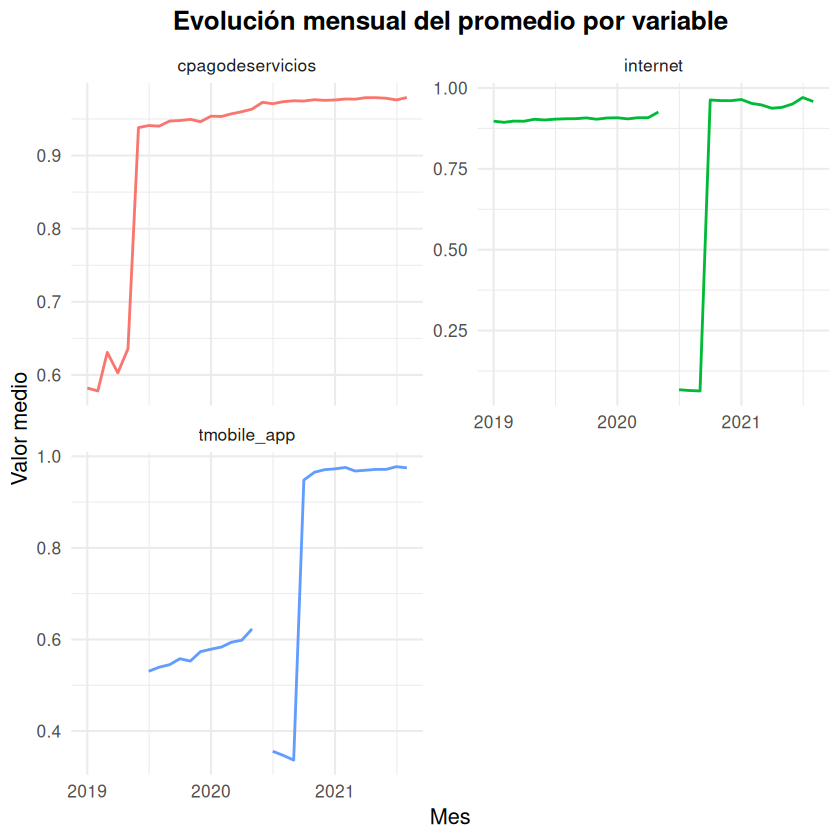

In [11]:
library(dplyr)
library(tidyr)
library(ggplot2)

# --- Variables de interés ---
vars_a_graficar <- c("internet", "cpagodeservicios", "tmobile_app")

# --- 1️⃣ Calcular el promedio mensual solo para las variables deseadas ---
mean_long <- dataset %>%
  select(foto_mes, all_of(vars_a_graficar)) %>%
  group_by(foto_mes) %>%
  summarise(across(everything(), ~mean(.x, na.rm = TRUE))) %>%
  pivot_longer(
    cols = -foto_mes,
    names_to = "variable",
    values_to = "mean_value"
  ) %>%
  mutate(fecha = as.Date(paste0(foto_mes, "01"), format = "%Y%m%d")) %>%
  ungroup()

# --- 2️⃣ Graficar todas las variables juntas (una por panel) ---
ggplot(mean_long, aes(x = fecha, y = mean_value, color = variable)) +
  geom_line(size = 0.8, show.legend = FALSE) +
  facet_wrap(~variable, scales = "free_y", ncol = 2) +
  labs(
    title = "Evolución mensual del promedio por variable",
    x = "Mes",
    y = "Valor medio"
  ) +
  theme_minimal(base_size = 13) +
  theme(plot.title = element_text(face = "bold", hjust = 0.5))


### Data Drifting

Se debe corregir el drifting natural que ocurre en loa datos, en particular los datos monetarios que se vieron fuertemente afectados por una alta inflación
<br> Posibles métodos son:
* No hacer absolutamente nada
* Ajuste de valores monetarios por indices del tipo :
   * IPC  Indice de Precios al Consumidor
   * Dolar Oficial
   * Dolar Blue
   * UVA  Unidad de Valor Adquisitivo

a este codigo de Data Drifting lo debera escribir usted

In [12]:
# suavizado de picos en payroll, caja de ahorro y cuenta corriente. 

library(data.table)

Sys.time()

vars_a_suavizar <- c("mpayroll", "mcaja_ahorro", "mcuenta_corriente")
umbral_aumento <- 1.5

setorder(dataset, numero_de_cliente, foto_mes)

for (v in vars_a_suavizar) {
  cat("Suavizando:", v, "\n")
  
  dataset[, `:=`(
    lag = shift(get(v), 1, type="lag"),
    lead = shift(get(v), 1, type="lead")
  ), by = numero_de_cliente]
  
  dataset[get(v) >= umbral_aumento * lag & !is.na(lag) & !is.na(lead),
          (v) := (lag + lead) / 2]
  
  dataset[, c("lag", "lead") := NULL]
}

gc()
Sys.time()
cat("✔ Suavizado de picos completado.\n")


[1] "2025-11-11 02:01:58 UTC"

Suavizando: mpayroll 
Suavizando: mcaja_ahorro 
Suavizando: mcuenta_corriente 


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,1574629,84.1,4334281,231.5,4334281,231.5
Vcells,1284163221,9797.4,2532197549,19319.2,2512868341,19171.7


[1] "2025-11-11 02:02:46 UTC"

✔ Suavizado de picos completado.


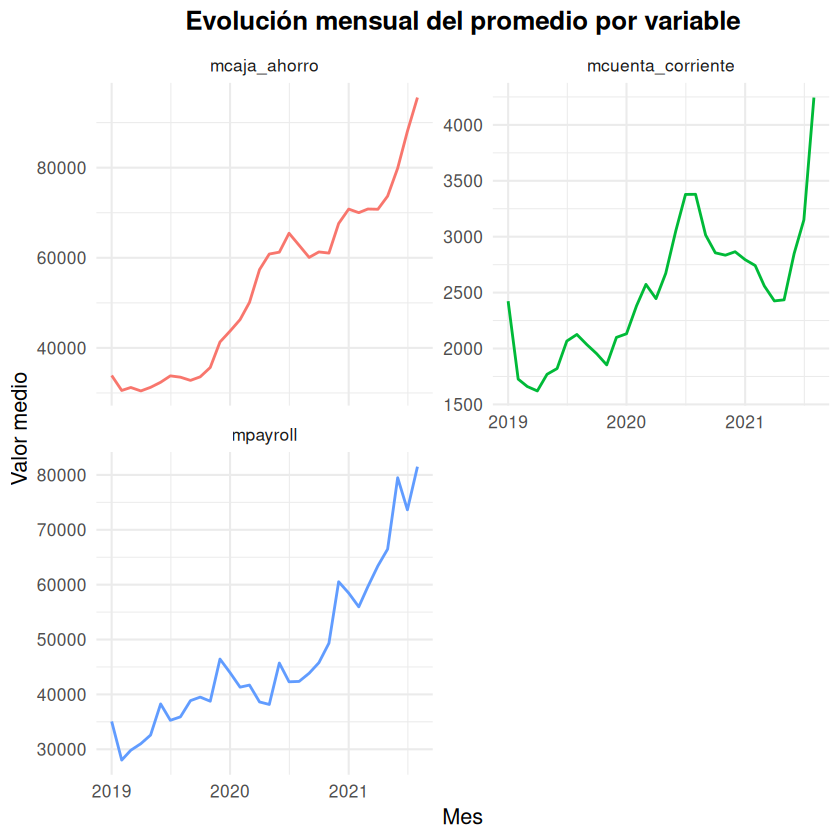

In [13]:
library(dplyr)
library(tidyr)
library(ggplot2)

# --- Variables de interés ---
vars_a_graficar <- c("mpayroll", "mcaja_ahorro", "mcuenta_corriente")

# --- 1️⃣ Calcular el promedio mensual solo para las variables deseadas ---
mean_long <- dataset %>%
  select(foto_mes, all_of(vars_a_graficar)) %>%
  group_by(foto_mes) %>%
  summarise(across(everything(), ~mean(.x, na.rm = TRUE))) %>%
  pivot_longer(
    cols = -foto_mes,
    names_to = "variable",
    values_to = "mean_value"
  ) %>%
  mutate(fecha = as.Date(paste0(foto_mes, "01"), format = "%Y%m%d")) %>%
  ungroup()

# --- 2️⃣ Graficar todas las variables juntas (una por panel) ---
ggplot(mean_long, aes(x = fecha, y = mean_value, color = variable)) +
  geom_line(size = 0.8, show.legend = FALSE) +
  facet_wrap(~variable, scales = "free_y", ncol = 2) +
  labs(
    title = "Evolución mensual del promedio por variable",
    x = "Mes",
    y = "Valor medio"
  ) +
  theme_minimal(base_size = 13) +
  theme(plot.title = element_text(face = "bold", hjust = 0.5))


### Feature Engineering Intra-Mes

Crear variables nuevas a partir de las existentes dentro del mismo registro, **sin** ir a buscar información histórica.
<br> El siguiente código es un mínimo ejemplo, agregar nuevos features a gusto

In [14]:
library(data.table)
setDT(dataset) 
# el mes 1,2, ..12 , podria servir para detectar estacionalidad
dataset[, kmes := foto_mes %% 100]

# creo un ctr_quarter que tenga en cuenta cuando
# los clientes hace 3 menos meses que estan
# ya que seria injusto considerar las transacciones medidas en menor tiempo
dataset[, ctrx_quarter_normalizado := as.numeric(ctrx_quarter) ]
dataset[cliente_antiguedad == 1, ctrx_quarter_normalizado := ctrx_quarter * 5.0]
dataset[cliente_antiguedad == 2, ctrx_quarter_normalizado := ctrx_quarter * 2.0]
dataset[cliente_antiguedad == 3, ctrx_quarter_normalizado := ctrx_quarter * 1.2]

# variable extraida de una tesis de maestria de Irlanda, se perdió el link
dataset[, mpayroll_sobre_edad := mpayroll / cliente_edad]

Sys.time()

[1] "2025-11-11 02:02:48 UTC"

### Feature Engineering Historico

In [15]:
if( !require("Rcpp")) install.packages("Rcpp", repos = "http://cran.us.r-project.org")
require("Rcpp")

Loading required package: Rcpp



In [16]:
# se calculan para los 6 meses previos el minimo, maximo y
#  tendencia calculada con cuadrados minimos
# la formula de calculo de la tendencia puede verse en
#  https://stats.libretexts.org/Bookshelves/Introductory_Statistics/Book%3A_Introductory_Statistics_(Shafer_and_Zhang)/10%3A_Correlation_and_Regression/10.04%3A_The_Least_Squares_Regression_Line
# para la maxíma velocidad esta funcion esta escrita en lenguaje C,
# y no en la porqueria de R o Python

cppFunction("NumericVector fhistC(NumericVector pcolumna, IntegerVector pdesde )
{
  /* Aqui se cargan los valores para la regresion */
  double  x[100] ;
  double  y[100] ;

  int n = pcolumna.size();
  NumericVector out( 5*n );

  for(int i = 0; i < n; i++)
  {
    //lag
    if( pdesde[i]-1 < i )  out[ i + 4*n ]  =  pcolumna[i-1] ;
    else                   out[ i + 4*n ]  =  NA_REAL ;


    int  libre    = 0 ;
    int  xvalor   = 1 ;

    for( int j= pdesde[i]-1;  j<=i; j++ )
    {
       double a = pcolumna[j] ;

       if( !R_IsNA( a ) )
       {
          y[ libre ]= a ;
          x[ libre ]= xvalor ;
          libre++ ;
       }

       xvalor++ ;
    }

    /* Si hay al menos dos valores */
    if( libre > 1 )
    {
      double  xsum  = x[0] ;
      double  ysum  = y[0] ;
      double  xysum = xsum * ysum ;
      double  xxsum = xsum * xsum ;
      double  vmin  = y[0] ;
      double  vmax  = y[0] ;

      for( int h=1; h<libre; h++)
      {
        xsum  += x[h] ;
        ysum  += y[h] ;
        xysum += x[h]*y[h] ;
        xxsum += x[h]*x[h] ;

        if( y[h] < vmin )  vmin = y[h] ;
        if( y[h] > vmax )  vmax = y[h] ;
      }

      out[ i ]  =  (libre*xysum - xsum*ysum)/(libre*xxsum -xsum*xsum) ;
      out[ i + n ]    =  vmin ;
      out[ i + 2*n ]  =  vmax ;
      out[ i + 3*n ]  =  ysum / libre ;
    }
    else
    {
      out[ i       ]  =  NA_REAL ;
      out[ i + n   ]  =  NA_REAL ;
      out[ i + 2*n ]  =  NA_REAL ;
      out[ i + 3*n ]  =  NA_REAL ;
    }
  }

  return  out;
}")

In [17]:
# calcula la tendencia de las variables cols de los ultimos 6 meses
# la tendencia es la pendiente de la recta que ajusta por cuadrados minimos
# La funcionalidad de ratioavg es autoria de  Daiana Sparta,  UAustral  2021

TendenciaYmuchomas <- function(
    dataset, cols, ventana = 6, tendencia = TRUE,
    minimo = TRUE, maximo = TRUE, promedio = TRUE,
    ratioavg = FALSE, ratiomax = FALSE) {
  gc(verbose= FALSE)
  # Esta es la cantidad de meses que utilizo para la historia
  ventana_regresion <- ventana

  last <- nrow(dataset)

  # creo el vector_desde que indica cada ventana
  # de esta forma se acelera el procesamiento ya que lo hago una sola vez
  vector_ids <- dataset[ , numero_de_cliente ]

  vector_desde <- seq(
    -ventana_regresion + 2,
    nrow(dataset) - ventana_regresion + 1
  )

  vector_desde[1:ventana_regresion] <- 1

  for (i in 2:last) {
    if (vector_ids[i - 1] != vector_ids[i]) {
      vector_desde[i] <- i
    }
  }
  for (i in 2:last) {
    if (vector_desde[i] < vector_desde[i - 1]) {
      vector_desde[i] <- vector_desde[i - 1]
    }
  }

  for (campo in cols) {
    nueva_col <- fhistC(dataset[, get(campo)], vector_desde)

    if (tendencia) {
      dataset[, paste0(campo, "_tend", ventana) :=
        nueva_col[(0 * last + 1):(1 * last)]]
    }

    if (minimo) {
      dataset[, paste0(campo, "_min", ventana) :=
        nueva_col[(1 * last + 1):(2 * last)]]
    }

    if (maximo) {
      dataset[, paste0(campo, "_max", ventana) :=
        nueva_col[(2 * last + 1):(3 * last)]]
    }

    if (promedio) {
      dataset[, paste0(campo, "_avg", ventana) :=
        nueva_col[(3 * last + 1):(4 * last)]]
    }

    if (ratioavg) {
      dataset[, paste0(campo, "_ratioavg", ventana) :=
        get(campo) / nueva_col[(3 * last + 1):(4 * last)]]
    }

    if (ratiomax) {
      dataset[, paste0(campo, "_ratiomax", ventana) :=
        get(campo) / nueva_col[(2 * last + 1):(3 * last)]]
    }
  }
}

In [18]:
# Feature Engineering Historico
# Creacion de LAGs
setorder(dataset, numero_de_cliente, foto_mes)

# todo es lagueable, menos la primary key y la clase
cols_lagueables <- copy( setdiff(
  colnames(dataset),
  c("numero_de_cliente", "foto_mes", "clase_ternaria")
))

# https://rdrr.io/cran/data.table/man/shift.html

# lags de orden 2
dataset[,
  paste0(cols_lagueables, "_lag2") := shift(.SD, 2, NA, "lag"),
  by= numero_de_cliente,
  .SDcols= cols_lagueables
]

# lags de orden 4
dataset[,
  paste0(cols_lagueables, "_lag4") := shift(.SD, 4, NA, "lag"),
  by= numero_de_cliente,
  .SDcols= cols_lagueables
]

# # lags de orden 3
# dataset[,
#   paste0(cols_lagueables, "_lag3") := shift(.SD, 3, NA, "lag"),
#   by= numero_de_cliente,
#   .SDcols= cols_lagueables
# ]

# agrego los delta lags
for (vcol in cols_lagueables)
{
  dataset[, paste0(vcol, "_delta2") := get(vcol) - get(paste0(vcol, "_lag2"))]
  dataset[, paste0(vcol, "_delta4") := get(vcol) - get(paste0(vcol, "_lag4"))]
  # dataset[, paste0(vcol, "_delta3") := get(vcol) - get(paste0(vcol, "_lag3"))]
}

Sys.time()

[1] "2025-11-11 02:06:22 UTC"

In [19]:
# parametros de Feature Engineering Historico de Tendencias
PARAM$FE_hist$Tendencias$run <- TRUE
PARAM$FE_hist$Tendencias$ventana <- 6
PARAM$FE_hist$Tendencias$tendencia <- TRUE
PARAM$FE_hist$Tendencias$minimo <- FALSE
PARAM$FE_hist$Tendencias$maximo <- FALSE
PARAM$FE_hist$Tendencias$promedio <- FALSE
PARAM$FE_hist$Tendencias$ratioavg <- FALSE
PARAM$FE_hist$Tendencias$ratiomax <- FALSE

In [20]:
# aqui se agregan las tendencias de los ultimos 6 meses

cols_lagueables <- intersect(cols_lagueables, colnames(dataset))
setorder(dataset, numero_de_cliente, foto_mes)

if( PARAM$FE_hist$Tendencias$run) {
    TendenciaYmuchomas(dataset,
    cols = cols_lagueables,
    ventana = PARAM$FE_hist$Tendencias$ventana, # 6 meses de historia
    tendencia = PARAM$FE_hist$Tendencias$tendencia,
    minimo = PARAM$FE_hist$Tendencias$minimo,
    maximo = PARAM$FE_hist$Tendencias$maximo,
    promedio = PARAM$FE_hist$Tendencias$promedio,
    ratioavg = PARAM$FE_hist$Tendencias$ratioavg,
    ratiomax = PARAM$FE_hist$Tendencias$ratiomax
  )
}

ncol(dataset)
Sys.time()

[1] 909

[1] "2025-11-11 02:09:12 UTC"

### Feature Engineering a partir de hojas de Random Forest

In [21]:
if( !require("lightgbm")) install.packages("lightgbm")
require("lightgbm")

Loading required package: lightgbm



In [22]:
AgregaVarRandomForest <- function() {

  cat( "inicio AgregaVarRandomForest()\n")
  gc(verbose= FALSE)
  dataset[, clase01 := 0L ]
  dataset[ clase_ternaria %in% c( "BAJA+2", "BAJA+1"),
      clase01 := 1L ]

  campos_buenos <- setdiff(
    colnames(dataset),
    c( "clase_ternaria", "clase01")
  )

  dataset[, entrenamiento :=
    as.integer( foto_mes %in% PARAM$FE_rf$train$training )]

  dtrain <- lgb.Dataset(
    data = data.matrix(dataset[entrenamiento == TRUE, campos_buenos, with = FALSE]),
    label = dataset[entrenamiento == TRUE, clase01],
    free_raw_data = FALSE
  )

  modelo <- lgb.train(
     data = dtrain,
     param = PARAM$FE_rf$lgb_param,
     verbose = -100
  )

  cat( "Fin construccion RandomForest\n" )
  # grabo el modelo, achivo .model
  lgb.save(modelo, file="modelo.model" )

  qarbolitos <- copy(PARAM$FE_rf$lgb_param$num_iterations)

  periodos <- dataset[ , unique( foto_mes ) ]

  for( periodo in  periodos )
  {
    cat( "periodo = ", periodo, "\n" )
    datamatrix <- data.matrix(dataset[ foto_mes== periodo, campos_buenos, with = FALSE])

    cat( "Inicio prediccion\n" )
    prediccion <- predict(
        modelo,
        datamatrix,
        type = "leaf"
    )
    cat( "Fin prediccion\n" )

    for( arbolito in 1:qarbolitos )
    {
       cat( arbolito, " " )
       hojas_arbol <- unique(prediccion[ , arbolito])

       for (pos in 1:length(hojas_arbol)) {
         # el numero de nodo de la hoja, estan salteados
         nodo_id <- hojas_arbol[pos]
         dataset[ foto_mes== periodo, paste0(
            "rf_", sprintf("%03d", arbolito),
             "_", sprintf("%03d", nodo_id)
          ) :=  as.integer( nodo_id == prediccion[ , arbolito]) ]

       }

       rm( hojas_arbol )
    }
    cat( "\n" )

    rm( prediccion )
    rm( datamatrix )
    gc(verbose= FALSE)
  }

  gc(verbose= FALSE)

  # borro clase01 , no debe ensuciar el dataset
  dataset[ , clase01 := NULL ]

}

In [23]:
# Parametros de Feature Engineering  a partir de hojas de Random Forest

# Estos CUATRO parametros son los que se deben modificar
PARAM$FE_rf$arbolitos= 20
PARAM$FE_rf$hojas_por_arbol= 16
PARAM$FE_rf$datos_por_hoja= 100
PARAM$FE_rf$mtry_ratio= 0.2

# Estos son quasi fijos
PARAM$FE_rf$train$training <- c( 202101, 202102, 202103)

# Estos TAMBIEN son quasi fijos
PARAM$FE_rf$lgb_param <-list(
    # parametros que se pueden cambiar
    num_iterations = PARAM$FE_rf$arbolitos,
    num_leaves  = PARAM$FE_rf$hojas_por_arbol,
    min_data_in_leaf = PARAM$FE_rf$datos_por_hoja,
    feature_fraction_bynode  = PARAM$FE_rf$mtry_ratio,

    # para que LightGBM emule Random Forest
    boosting = "rf",
    bagging_fraction = ( 1.0 - 1.0/exp(1.0) ),
    bagging_freq = 1.0,
    feature_fraction = 1.0,

    # genericos de LightGBM
    max_bin = 31L,
    objective = "binary",
    first_metric_only = TRUE,
    boost_from_average = TRUE,
    feature_pre_filter = FALSE,
    force_row_wise = TRUE,
    verbosity = -100,
    max_depth = -1L,
    min_gain_to_split = 0.0,
    min_sum_hessian_in_leaf = 0.001,
    lambda_l1 = 0.0,
    lambda_l2 = 0.0,

    pos_bagging_fraction = 1.0,
    neg_bagging_fraction = 1.0,
    is_unbalance = FALSE,
    scale_pos_weight = 1.0,

    drop_rate = 0.1,
    max_drop = 50,
    skip_drop = 0.5,

    extra_trees = FALSE
  )

In [24]:
# Feature Engineering agregando variables de Random Forest
#  aqui es donde se hace el trabajo
AgregaVarRandomForest()

Sys.time()

inicio AgregaVarRandomForest()
Fin construccion RandomForest
periodo =  201901 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201902 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201903 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201904 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201905 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201906 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201907 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  
periodo =  201908 
Inicio prediccion
Fin prediccion
1  2  3  4  5  6  7

[1] "2025-11-11 02:15:19 UTC"

In [25]:
# Acá me quedo con las 20 mejores variables creadas por random forest

# El objeto 'dataset' debe estar disponible y con las variables rf_
require( "data.table" )

# 1. Definir la variable objetivo temporal
# La clase01 ya fue creada dentro de AgregaVarRandomForest, la recreamos para este paso.
dataset[, clase01 := 0L ]
dataset[ clase_ternaria %in% c( "BAJA+2", "BAJA+1"), clase01 := 1L ]

# 2. Identificar todas las features de Random Forest (rf_)
rf_cols <- grep("^rf_", colnames(dataset), value = TRUE)

# 3. Calcular la correlación de cada feature 'rf_' con 'clase01'
# Usaremos la correlación absoluta para medir la fuerza de la relación.
correlaciones <- sapply(dataset[, rf_cols, with = FALSE], function(x) {
  abs(cor(x, dataset$clase01))
})

# 4. Seleccionar los nombres de las 20 features con mayor correlación
# Usamos 'sort' y 'tail' para obtener los 20 valores más altos
top_20_features <- names(tail(sort(correlaciones), 20))

# 5. Obtener todas las columnas que NO son features rf_ (las originales y lags/deltas)
otras_cols <- setdiff(colnames(dataset), rf_cols)

# Columnas a eliminar (todas las rf_ que no están en el top 20)
columnas_a_eliminar <- setdiff(rf_cols, top_20_features)

# Aplicar eliminación
dataset[, (columnas_a_eliminar) := NULL]
dataset[, clase01 := NULL ]


In [26]:
ncol(dataset)
colnames(dataset)

[1] 930

[1] "numero_de_cliente"                          
  [2] "foto_mes"                                   
  [3] "active_quarter"                             
  [4] "cliente_vip"                                
  [5] "internet"                                   
  [6] "cliente_edad"                               
  [7] "cliente_antiguedad"                         
  [8] "mrentabilidad"                              
  [9] "mrentabilidad_annual"                       
 [10] "mcomisiones"                                
 [11] "mactivos_margen"                            
 [12] "mpasivos_margen"                            
 [13] "cproductos"                                 
 [14] "tcuentas"                                   
 [15] "ccuenta_corriente"                          
 [16] "mcuenta_corriente_adicional"                
 [17] "mcuenta_corriente"                          
 [18] "ccaja_ahorro"                               
 [19] "mcaja_ahorro"                               
 [20] "mcaja_ahorro_adicional"                     
 [21] "mcaja_ahorro_dolares"                       
 [22] "cdescubierto_preacordado"                   
 [23] "mcuentas_saldo"                             
 [24] "ctarjeta_debito"                            
 [25] "ctarjeta_debito_transacciones"              
 [26] "mautoservicio"                              
 [27] "ctarjeta_visa"                              
 [28] "ctarjeta_visa_transacciones"                
 [29] "mtarjeta_visa_consumo"                      
 [30] "ctarjeta_master"                            
 [31] "ctarjeta_master_transacciones"              
 [32] "mtarjeta_master_consumo"                    
 [33] "cprestamos_prendarios"                      
 [34] "mprestamos_prendarios"                      
 [35] "cprestamos_hipotecarios"                    
 [36] "mprestamos_hipotecarios"                    
 [37] "cplazo_fijo"                                
 [38] "mplazo_fijo_dolares"                        
 [39] "mplazo_fijo_pesos"                          
 [40] "cinversion1"                                
 [41] "minversion1_pesos"                          
 [42] "minversion1_dolares"                        
 [43] "cinversion2"                                
 [44] "minversion2"                                
 [45] "cseguro_vida"                               
 [46] "cseguro_auto"                               
 [47] "cseguro_vivienda"                           
 [48] "cseguro_accidentes_personales"              
 [49] "ccaja_seguridad"                            
 [50] "cpayroll_trx"                               
 [51] "mpayroll"                                   
 [52] "mpayroll2"                                  
 [53] "cpayroll2_trx"                              
 [54] "ccuenta_debitos_automaticos"                
 [55] "mcuenta_debitos_automaticos"                
 [56] "ctarjeta_visa_debitos_automaticos"          
 [57] "mttarjeta_visa_debitos_automaticos"         
 [58] "ctarjeta_master_debitos_automaticos"        
 [59] "mttarjeta_master_debitos_automaticos"       
 [60] "cpagodeservicios"                           
 [61] "mpagodeservicios"                           
 [62] "cpagomiscuentas"                            
 [63] "mpagomiscuentas"                            
 [64] "ccajeros_propios_descuentos"                
 [65] "mcajeros_propios_descuentos"                
 [66] "ctarjeta_visa_descuentos"                   
 [67] "mtarjeta_visa_descuentos"                   
 [68] "ctarjeta_master_descuentos"                 
 [69] "mtarjeta_master_descuentos"                 
 [70] "ccomisiones_mantenimiento"                  
 [71] "mcomisiones_mantenimiento"                  
 [72] "ccomisiones_otras"                          
 [73] "mcomisiones_otras"                          
 [74] "cforex"                                     
 [75] "cforex_buy"                                 
 [76] "mforex_buy"                                 
 [77] "cforex_sell"                               

### Reduccion dimensionalidad con canaritos asesinos

Intencionalmente este código no se brinda
<br> El objetivo de esto es reducir la dimensionalidad del dataset unicamente para que la Bayesian Optimization corra mas rápido
<br> Tambien se puede probar con Boruta

## Modelado

### Target Engineering

In [27]:
# paso la clase a binaria que tome valores {0,1}  enteros
#  BAJA+1 y BAJA+2  son  1,   CONTINUA es 0
#  a partir de ahora ya NO puedo cortar  por prob(BAJA+2) > 1/40

dataset[, clase01 := ifelse(clase_ternaria %in% c("BAJA+2","BAJA+1"), 1L, 0L)]

### Training Strategy

Se hace una estrategia de entrenamiento muy sencilla, tomando todos los meses posibles, SIN eliminar nada x pandemia ni por ningun otro motivo

* future = 202108  obviamente completo

* final_train =  [201901, 202106] sin undersampling de los CONTINUA

* training
   * testing = 202106
   * training = [201901, 202104]  donde se consideran el 5% de los CONTINUA

In [28]:
PARAM$trainingstrategy$testing <- c(202105)

PARAM$trainingstrategy$training <- c(
  201901, 201903, 201905,
  201907, 201909, 201911,
  202001, 202003, 202005,
  202007, 202009, 202011,
  202101, 202103
)

PARAM$trainingstrategy$undersampling <- 0.04


PARAM$trainingstrategy$positivos <- c( "BAJA+1", "BAJA+2")

In [29]:
# los campos en los que se entrena
campos_buenos <- copy( setdiff(
    colnames(dataset), c("clase_ternaria","clase01","azar"))
)

#### Registros  cambio las proporciones de POS/NEG

In [30]:
# Undersampling, van todos los "BAJA+1" y "BAJA+2" y solo algunos "CONTINIA"

set.seed(PARAM$semilla_primigenia, kind = "L'Ecuyer-CMRG")
dataset[, azar := runif(nrow(dataset))]
dataset[, training := 0L]

dataset[  foto_mes %in%  PARAM$trainingstrategy$training &
  (azar <= PARAM$trainingstrategy$undersampling | clase_ternaria %in% c("BAJA+1", "BAJA+2")),
  training := 1L
]


### Optimizacion de Hipeparámetros

Se optimizan los hiperparámetros maximizando la ganancia.

In [31]:
if( !require("lightgbm")) install.packages("lightgbm")
require("lightgbm")

In [32]:
dtrain <- lgb.Dataset(
  data= data.matrix(dataset[training == 1L, campos_buenos, with = FALSE]),
  label= dataset[training == 1L, clase01],
  free_raw_data= TRUE
)

cat("filas", nrow(dtrain), "columnas", ncol(dtrain), "\n")
Sys.time()

filas 97442 columnas 929 


[1] "2025-11-11 02:19:32 UTC"

In [33]:
# defino los datos de testing
dataset_test <- dataset[foto_mes %in% PARAM$trainingstrategy$testing]

# precalculo el campo de la ganancia
dataset_test[, gan := -20000.0 ]
dataset_test[ clase_ternaria=="BAJA+2", gan := 780000]

# precalculo la test_matrix
test_matrix <- data.matrix(dataset_test[, campos_buenos, with= FALSE])

cat("filas", nrow(dataset_test), "columnas", ncol(dataset_test), "\n")
Sys.time()

filas 163917 columnas 934 


[1] "2025-11-11 02:19:35 UTC"

In [34]:
# paquetes necesarios para la Bayesian Optimization
if(!require("DiceKriging")) install.packages("DiceKriging")
require("DiceKriging")

if(!require("mlrMBO")) install.packages("mlrMBO")
require("mlrMBO")

Loading required package: DiceKriging

Loading required package: mlrMBO

Loading required package: mlr

Loading required package: ParamHelpers

Loading required package: smoof

Loading required package: checkmate


Attaching package: ‘checkmate’


The following object is masked from ‘package:DiceKriging’:

    checkNames




In [35]:
# Especificacion de la cantidad de iteraciones de la Bayesian Optimization
# 50 es razonable
PARAM$hipeparametertuning$BO_iteraciones <- 50 # un 50 seria mas razonable

In [36]:
# parametros fijos del LightGBM
PARAM$lgbm$param_fijos <- list(
  objective= "binary",
  metric= "custom",
  first_metric_only= TRUE,
  boost_from_average= TRUE,
  feature_pre_filter= FALSE,
  verbosity= -100,
  force_row_wise= TRUE, # para evitar warning
  seed= PARAM$semilla_primigenia,
  extra_trees = FALSE,

  max_depth = -1L, # -1 significa no limitar,  por ahora lo dejo fijo
  min_gain_to_split = 0.0, # min_gain_to_split >= 0.0
  min_sum_hessian_in_leaf = 0.001, #  min_sum_hessian_in_leaf >= 0.0
  # lambda_l1 = 0.0, # lambda_l1 >= 0.0
  # lambda_l2 = 0.0, # lambda_l2 >= 0.0

  bagging_fraction = 1.0, # 0.0 < bagging_fraction <= 1.0
  pos_bagging_fraction = 1.0, # 0.0 < pos_bagging_fraction <= 1.0
  neg_bagging_fraction = 1.0, # 0.0 < neg_bagging_fraction <= 1.0
  is_unbalance = FALSE, #
  scale_pos_weight = 1.0, # scale_pos_weight > 0.0

  drop_rate = 0.1, # 0.0 < neg_bagging_fraction <= 1.0
  max_drop = 50, # <=0 means no limit
  skip_drop = 0.5, # 0.0 <= skip_drop <= 1.0

  max_bin= 31
)

In [37]:
# Notar que se recorren algunos hiperparametros en forma logaritmica
#   y que con forbidden se tiene en cuenta el juego que hay entre min_data_in_leaf y num_leaves

PARAM$hipeparametertuning$hs <- makeParamSet(
  makeNumericParam("num_iterations", lower= 0.0, upper= 11.1, trafo= function(x) as.integer( round(2^x)) ),
  makeNumericParam("learning_rate", lower= -8.0, upper= -1.0, trafo= function(x) 2^x ),
  makeNumericParam("feature_fraction", lower= 0.05, upper= 1.0 ),
  makeNumericParam("min_data_in_leaf", lower= 0.0, upper= log2(nrow(dtrain)/2), trafo= function(x) as.integer(round(2^x)) ),
  makeNumericParam("num_leaves", lower= 1.0, upper= 10.0, trafo= function(x) as.integer(round(2^x)) ),
  # rango para L1/L2
  makeNumericParam("lambda_l1", lower = -10, upper = 1, trafo= function(x) 10^x), 
  makeNumericParam("lambda_l2", lower = -10, upper = 1, trafo= function(x) 10^x),
  forbidden= quote( (2^min_data_in_leaf)*(2^num_leaves) > nrow(dtrain) )
)

El parámetro **ksemillerio** indica se se hace semillerio DENTRO de la bayesiana
* 1 **no** se hace Ensemble Semillerio, apenas se corre un solo LightGBM
* mayor a 1, se hace un  k-Ensemble Semillerio

El parámetro  **repe** indica si dentro de la bayesiana se toman varias medidas y luego se promedian
<br> Esto se hace ya sea que se llama a un solo LightGBM o se haceun Ensemble Semillerio de LightGBMs
<br> Tener en cuenta que repe multiplica linealmente el tiempo de corrida de la Bayesian Optimization

In [38]:
PARAM$hipeparametertuning$ksemillerio <- 20L
PARAM$hipeparametertuning$repe <- 2L


In [39]:
if(!require("primes")) install.packages("primes")
require("primes")

Loading required package: primes



In [40]:
primos <- generate_primes(min = 100000, max = 1000000)
set.seed(PARAM$semilla_primigenia, kind = "L'Ecuyer-CMRG")
# me quedo con PARAM$semillerio  primos al azar
PARAM$BO$semillas <- sample(primos)[seq( PARAM$hipeparametertuning$ksemillerio * PARAM$hipeparametertuning$repe )]

cat( PARAM$BO$semillas)

696323 757751 538397 735733 585019 278819 571381 121063 143357 503233 261523 607363 250643 941099 908419 231947 442979 229423 320329 252173 420569 389029 202667 842419 393103 326063 582299 517277 861797 402487 703499 982117 175781 619687 815671 835909 918647 280541 641101 167627

In [41]:
if(!require("rlist")) install.packages("rlist")
require("rlist")

Loading required package: rlist



In [42]:
# logueo al archivo BO_log.txt
loguear  <- function( reg, arch=NA, verbose=TRUE )
{
  t0 <- Sys.time()
  archivo <- arch
  if( is.na(arch) ) archivo <- paste0( folder, substitute( reg), ext )


  if( !file.exists( archivo ) )
  {
    # Escribo los titulos
    linea  <- paste0( "fecha\t", 
                      paste( list.names(reg), collapse="\t" ), "\n" )

    cat( linea, file=archivo )
  }

  # escribo el registro
  linea  <- paste0( format(t0, "%Y%m%d.%H%M%S"),  "\t",     # la fecha y hora
                    gsub( ", ", "\t", toString( reg ) ),  "\n" )

  cat( linea, file=archivo, append=TRUE )  # grabo al archivo

  if( verbose )  cat( linea )   # imprimo por pantalla
}

In [43]:
# esto esta en una funcion para que el garbage collector lo libere
# entrena, aplica el modelo a testing, y devuelve el vector de probabilidades

OneTrainPredict <- function(param_completo) {
    
  modelo <- lgb.train(
    data= dtrain,
    param= param_completo
  )
  gmodelo <<- modelo

  # aplico el modelo a los datos nuevos
  pred <- predict(
    modelo,
    test_matrix
  )

  return( pred )
}

In [44]:
# En el argumento x llegan los parmaetros de la bayesiana
#  devuelve la ganancia en datos de testing

# aqui se ira guardando la mejor iteracion de la bayesiana
gmejor <- list()
gmejor$iter <- 0
gmejor$gan <- -Inf

giter <- 0
if( file.exists("BO_log.txt") ){
  tb_BO <- fread("BO_log.txt")
  giter <- nrow(tb_BO) -1 
}

# --- Para guardar la ganancia de cada semilla ---
PARAM$cortes <- seq(8000, 14000, by= 100) # Cortes solicitados
# Global: Se usará para guardar las curvas de ganancia de la mejor iteración BO
gcurvas_ganancia <- list()

EstimarGanancia_lightgbm <- function(x) {

  giter <<- giter + 1
  param_completo <- modifyList(PARAM$lgbm$param_fijos, x)

  vgan_mesetas <- c()
  curvas_de_ganancia_temp <- list()  # Inicializa la lista temporal aquí

  # loop de las repeticiones
  for (repe in seq(PARAM$hipeparametertuning$repe)) {

    desde <- (repe - 1) * PARAM$hipeparametertuning$ksemillerio + 1
    hasta <- desde + PARAM$hipeparametertuning$ksemillerio - 1
    rsemillas <- PARAM$BO$semillas[desde:hasta]

    # vector inicial de probabilidades para el promedio de la meseta
    vpred_acum <- rep(0.0, nrow(dataset_test))

    # loop del semillerio
    for (sem in rsemillas) {
      param_completo$seed <- sem  # asigno semilla
      
      # --- ENTRENAMIENTO Y PREDICCIÓN POR SEMILLA ---
      vpred_semilla <- OneTrainPredict(param_completo)
      vpred_acum <- vpred_acum + vpred_semilla  # acumula para promedio
      
      # --- CÁLCULO Y ALMACENAMIENTO DE CURVA DE GANANCIA POR SEMILLA ---
      tb_prediccion_sem <- dataset_test[, .(gan)]
      tb_prediccion_sem[, prob := vpred_semilla]
      setorder(tb_prediccion_sem, -prob)
      tb_prediccion_sem[, gan_acum := cumsum(gan)]
      
      # obtiene la ganancia en los cortes definidos
      ganancias_en_cortes <- sapply(PARAM$cortes, function(envios) {
        if (envios <= nrow(tb_prediccion_sem)) {
          tb_prediccion_sem[envios, gan_acum]
        } else {
          NA_real_
        }
      })
      
      # almacena el vector en la lista temporal
      curvas_de_ganancia_temp[[paste0("sem_", sem)]] <- ganancias_en_cortes
      
      gc(full = TRUE, verbose = FALSE)
    }

    # cálculo de ganancia suavizada de la meseta (usa vpred_acum promedio)
    tb_prediccion <- dataset_test[, .(gan)]
    tb_prediccion[, prob := vpred_acum]
    setorder(tb_prediccion, -prob)
    tb_prediccion[, gan_acum := cumsum(gan)]

    tb_prediccion[, gan_meseta := frollmean(
      x = gan_acum, n = 2001, align = "center",
      na.rm = TRUE, hasNA = TRUE
    )]

    vgan_mesetas <- c(vgan_mesetas, tb_prediccion[, max(gan_meseta, na.rm = TRUE)])
  }

  gan_mesetas_prom <- mean(vgan_mesetas)

  if (gan_mesetas_prom > gmejor$gan) {
    gmejor$gan <<- gan_mesetas_prom
    gmejor$iter <<- giter
    gcurvas_ganancia <<- curvas_de_ganancia_temp

    # guarda importancia de variables (si el modelo existe en el entorno global)
    if (exists("gmodelo")) {
      fwrite(lgb.importance(gmodelo),
        file = paste0("impo_", giter, ".txt"),
        sep = "\t"
      )
    }
  }

  # datos a loguear (final de la función)
  xx <- copy(param_completo)
  xx$iter <- giter
  xx$metrica_mejor <- gmejor$gan
  xx$metrica_sd <- sd(vgan_mesetas)
  xx$metrica <- gan_mesetas_prom

  loguear(xx, "BO_log.txt")

  # restablece la semilla original para mlrMBO
  set.seed(PARAM$semilla_primigenia, kind = "L'Ecuyer-CMRG")

  return(gan_mesetas_prom)
}


In [45]:
# Aqui comienza la configuracion de la Bayesian Optimization
#  es compleja la configuracion de una Bayesian Optimization

# en este archivo quedan la evolucion binaria de la BO
kbayesiana <- "bayesiana.RDATA"

funcion_optimizar <- EstimarGanancia_lightgbm # la funcion que voy a maximizar

configureMlr(show.learner.output= FALSE)

# configuro la busqueda bayesiana,  los hiperparametros que se van a optimizar
# por favor, no desesperarse por lo complejo

obj.fun <- makeSingleObjectiveFunction(
  fn= funcion_optimizar, # la funcion que voy a maximizar
  minimize= FALSE, # estoy Maximizando la ganancia
  noisy= TRUE,
  par.set= PARAM$hipeparametertuning$hs, # definido al comienzo del programa
  has.simple.signature= FALSE # paso los parametros en una lista
)

# cada 600 segundos guardo el resultado intermedio
ctrl <- makeMBOControl(
  save.on.disk.at.time= 600, # se graba cada 600 segundos
  save.file.path= kbayesiana
) # se graba cada 600 segundos

# indico la cantidad de iteraciones que va a tener la Bayesian Optimization
ctrl <- setMBOControlTermination(
  ctrl,
  iters= PARAM$hipeparametertuning$BO_iteraciones
) # cantidad de iteraciones

# defino el método estandar para la creacion de los puntos iniciales,
# los "No Inteligentes"
ctrl <- setMBOControlInfill(ctrl, crit= makeMBOInfillCritEI())

# establezco la funcion que busca el maximo
surr.km <- makeLearner(
  "regr.km",
  predict.type= "se",
  covtype= "matern3_2",
  control= list(trace= TRUE)
)

Sys.time()

[1] "2025-11-11 02:19:37 UTC"

#### Corrida de la Bayesian Optimization

In [46]:
# inicio la optimizacion bayesiana, retomando si ya existe
# es la celda mas lenta de todo el notebook

if (!file.exists(kbayesiana)) {
  bayesiana_salida <- mbo(obj.fun, learner= surr.km, control= ctrl)
} else {
  bayesiana_salida <- mboContinue(kbayesiana) # retomo en caso que ya exista
}
save(gcurvas_ganancia, file="curvas_ganancia_optima.RDATA")

Sys.time()

Computing y column(s) for design. Not provided.



20251111.023110	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	131	0.0215874117736398	0.576601929597421	3	68	0.00229067836003408	1.22361209087819e-07	1	174961094.452774	105567.756027836	174961094.452774
20251111.023341	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	20	0.125880335515909	0.4561899579812	239	38	0.0046506444290388	0.0352403624999592	2	174961094.452774	450936.942197166	170694992.503748
20251111.023625	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	28	0.120329310043171	0.400799976126366	105	9	9.08840376526429e-05	2.80769797046498e-05	3	174961094.452774	1091488.75528342	151219975.012494
20251111.023809	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	7	0.0153844396327305	0.486591774766653	487	6	4.15325568800461e-05	0.00051768555647209	4	174961094.452774	1554412.23522064	123256426.786607
20251111.02404

[mbo] 0: num_iterations=131; learning_rate=0.0216; feature_fraction=0.577; min_data_in_leaf=3; num_leaves=68; lambda_l1=0.00229; lambda_l2=1.22e-07 : y = 1.75e+08 : 694.0 secs : initdesign

[mbo] 0: num_iterations=20; learning_rate=0.126; feature_fraction=0.456; min_data_in_leaf=239; num_leaves=38; lambda_l1=0.00465; lambda_l2=0.0352 : y = 1.71e+08 : 151.1 secs : initdesign

[mbo] 0: num_iterations=28; learning_rate=0.12; feature_fraction=0.401; min_data_in_leaf=105; num_leaves=9; lambda_l1=9.09e-05; lambda_l2=2.81e-05 : y = 1.51e+08 : 163.5 secs : initdesign

[mbo] 0: num_iterations=7; learning_rate=0.0154; feature_fraction=0.487; min_data_in_leaf=487; num_leaves=6; lambda_l1=4.15e-05; lambda_l2=0.000518 : y = 1.23e+08 : 103.8 secs : initdesign

[mbo] 0: num_iterations=38; learning_rate=0.00946; feature_fraction=0.169; min_data_in_leaf=167; num_leaves=14; lambda_l1=0.0188; lambda_l2=5.9e-06 : y = 1.41e+08 : 157.0 secs : initdesign

[mbo] 0: num_iterations=449; learning_rate=0.0337; fe

20251111.105240	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1985	0.366139070716706	0.574284334398228	3	64	4.84435953539453e-06	1.68199161591946e-09	29	190662423.788106	767004.132216587	190662423.788106


[mbo] 1: num_iterations=1985; learning_rate=0.366; feature_fraction=0.574; min_data_in_leaf=3; num_leaves=64; lambda_l1=4.84e-06; lambda_l2=1.68e-09 : y = 1.91e+08 : 8102.9 secs : infill_ei

Saved the current state after iteration 2 in the file bayesiana.RDATA.



20251111.113830	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	698	0.250851906898747	0.551219961150277	4	43	6.31981760110903e-09	0.119653071808448	30	190662423.788106	76534.3261716108	183891399.30035


[mbo] 2: num_iterations=698; learning_rate=0.251; feature_fraction=0.551; min_data_in_leaf=4; num_leaves=43; lambda_l1=6.32e-09; lambda_l2=0.12 : y = 1.84e+08 : 2745.9 secs : infill_ei

Saved the current state after iteration 3 in the file bayesiana.RDATA.



20251111.134225	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1007	0.0797938925994367	0.468103952284483	9	450	1.03246219768662e-06	1.02337300461058e-10	31	190662423.788106	824109.807298919	188191509.245377


[mbo] 3: num_iterations=1007; learning_rate=0.0798; feature_fraction=0.468; min_data_in_leaf=9; num_leaves=450; lambda_l1=1.03e-06; lambda_l2=1.02e-10 : y = 1.88e+08 : 7431.2 secs : infill_ei

Saved the current state after iteration 4 in the file bayesiana.RDATA.



20251111.151214	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1508	0.124845765769181	0.471109015125543	2	37	0.00230099633862818	1.01150615961672e-10	32	190662423.788106	976655.462122815	182666481.75912


[mbo] 4: num_iterations=1508; learning_rate=0.125; feature_fraction=0.471; min_data_in_leaf=2; num_leaves=37; lambda_l1=0.0023; lambda_l2=1.01e-10 : y = 1.83e+08 : 5384.6 secs : infill_ei

Saved the current state after iteration 5 in the file bayesiana.RDATA.



20251111.154913	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	420	0.497856196799767	0.563124566155316	40	130	1.59028731283064e-07	1.17318611992834e-08	33	193168520.73963	2053366.00371848	193168520.73963


[mbo] 5: num_iterations=420; learning_rate=0.498; feature_fraction=0.563; min_data_in_leaf=40; num_leaves=130; lambda_l1=1.59e-07; lambda_l2=1.17e-08 : y = 1.93e+08 : 2214.0 secs : infill_ei

Saved the current state after iteration 6 in the file bayesiana.RDATA.



20251111.182649	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	2193	0.370617040959088	0.519432532186149	63	201	9.65950412142482e-08	1.78454076042669e-06	34	193168520.73963	75714.4922224166	186035107.446277


[mbo] 6: num_iterations=2193; learning_rate=0.371; feature_fraction=0.519; min_data_in_leaf=63; num_leaves=201; lambda_l1=9.66e-08; lambda_l2=1.78e-06 : y = 1.86e+08 : 9452.2 secs : infill_ei

Saved the current state after iteration 7 in the file bayesiana.RDATA.



20251111.184245	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	336	0.394114576002985	0.806427617113985	2	73	6.46621146591409e-08	3.44304352111833e-09	35	193168520.73963	1243490.20998586	187434922.538731


[mbo] 7: num_iterations=336; learning_rate=0.394; feature_fraction=0.806; min_data_in_leaf=2; num_leaves=73; lambda_l1=6.47e-08; lambda_l2=3.44e-09 : y = 1.87e+08 : 951.9 secs : infill_ei

Saved the current state after iteration 8 in the file bayesiana.RDATA.



20251111.191427	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	602	0.498699255066247	0.260991962416785	34	75	6.51362083872052e-06	7.13361016547076e-09	36	193168520.73963	102168.272152247	188519200.3998


[mbo] 8: num_iterations=602; learning_rate=0.499; feature_fraction=0.261; min_data_in_leaf=34; num_leaves=75; lambda_l1=6.51e-06; lambda_l2=7.13e-09 : y = 1.89e+08 : 1897.6 secs : infill_ei

Saved the current state after iteration 9 in the file bayesiana.RDATA.



20251111.203329	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	984	0.0461241798232717	0.517972671422844	28	125	6.5678307831508e-10	6.1005921374766e-10	37	193168520.73963	556087.713716343	185160829.585207


[mbo] 9: num_iterations=984; learning_rate=0.0461; feature_fraction=0.518; min_data_in_leaf=28; num_leaves=125; lambda_l1=6.57e-10; lambda_l2=6.1e-10 : y = 1.85e+08 : 4737.3 secs : infill_ei

Saved the current state after iteration 10 in the file bayesiana.RDATA.



20251111.210827	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	286	0.484407158596571	0.573895339238406	17	417	2.14985101769987e-05	7.34730117660632e-09	38	193168520.73963	1248359.74094277	188629260.369815


[mbo] 10: num_iterations=286; learning_rate=0.484; feature_fraction=0.574; min_data_in_leaf=17; num_leaves=417; lambda_l1=2.15e-05; lambda_l2=7.35e-09 : y = 1.89e+08 : 2093.6 secs : infill_ei

Saved the current state after iteration 11 in the file bayesiana.RDATA.



20251111.223239	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	360	0.0387857660014198	0.528537758128936	5	1024	7.61344263448343e-08	0.000137242815583786	39	193168520.73963	496670.955001341	187096486.756622


[mbo] 11: num_iterations=360; learning_rate=0.0388; feature_fraction=0.529; min_data_in_leaf=5; num_leaves=1024; lambda_l1=7.61e-08; lambda_l2=0.000137 : y = 1.87e+08 : 5048.0 secs : infill_ei

Saved the current state after iteration 12 in the file bayesiana.RDATA.



20251111.231823	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	2166	0.498830876371142	0.660212875874339	88	18	2.64281759853271e-07	9.70245520645007e-09	40	193168520.73963	214499.658260983	190333763.118441


[mbo] 12: num_iterations=2166; learning_rate=0.499; feature_fraction=0.66; min_data_in_leaf=88; num_leaves=18; lambda_l1=2.64e-07; lambda_l2=9.7e-09 : y = 1.9e+08 : 2739.6 secs : infill_ei

Saved the current state after iteration 13 in the file bayesiana.RDATA.



20251111.234557	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	417	0.248672585743194	0.606965093946942	18	137	4.0644731858341e-06	3.94017003096076e-08	41	193168520.73963	1306037.88628272	188368955.522239


[mbo] 13: num_iterations=417; learning_rate=0.249; feature_fraction=0.607; min_data_in_leaf=18; num_leaves=137; lambda_l1=4.06e-06; lambda_l2=3.94e-08 : y = 1.88e+08 : 1649.4 secs : infill_ei

Saved the current state after iteration 14 in the file bayesiana.RDATA.



20251112.012616	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	610	0.00414791129886341	0.456757514391412	7	766	2.27696923120257e-06	1.10144197532655e-10	42	193168520.73963	626176.448839056	180082603.698151


[mbo] 14: num_iterations=610; learning_rate=0.00415; feature_fraction=0.457; min_data_in_leaf=7; num_leaves=766; lambda_l1=2.28e-06; lambda_l2=1.1e-10 : y = 1.8e+08 : 6014.6 secs : infill_ei

Saved the current state after iteration 15 in the file bayesiana.RDATA.



20251112.015454	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	362	0.495456223951135	0.600716246848842	549	127	3.61902128489651e-08	1.08476220710658e-10	43	193168520.73963	4023455.25378656	185537716.141929


[mbo] 15: num_iterations=362; learning_rate=0.495; feature_fraction=0.601; min_data_in_leaf=549; num_leaves=127; lambda_l1=3.62e-08; lambda_l2=1.08e-10 : y = 1.86e+08 : 1714.0 secs : infill_ei

Saved the current state after iteration 16 in the file bayesiana.RDATA.



20251112.035058	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1948	0.499755038285901	0.571316220143233	5	30	6.77395714795847e-08	1.57860120968956e-07	44	193168520.73963	3318355.65226877	134172598.70065


[mbo] 16: num_iterations=1948; learning_rate=0.5; feature_fraction=0.571; min_data_in_leaf=5; num_leaves=30; lambda_l1=6.77e-08; lambda_l2=1.58e-07 : y = 1.34e+08 : 6959.2 secs : infill_ei

Saved the current state after iteration 17 in the file bayesiana.RDATA.



20251112.045041	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1021	0.0872481711229846	0.386131500305683	3	54	5.62607747213568e-07	2.36650565069664e-06	45	193168520.73963	1642247.54832995	184681694.152924


[mbo] 17: num_iterations=1021; learning_rate=0.0872; feature_fraction=0.386; min_data_in_leaf=3; num_leaves=54; lambda_l1=5.63e-07; lambda_l2=2.37e-06 : y = 1.85e+08 : 3579.0 secs : infill_ei

Saved the current state after iteration 18 in the file bayesiana.RDATA.



20251112.054524	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	2178	0.173071098310594	0.61565043981118	704	17	1.85343502761272e-07	4.82487616541076e-10	46	193168520.73963	3190249.53017194	182257586.206897


[mbo] 18: num_iterations=2178; learning_rate=0.173; feature_fraction=0.616; min_data_in_leaf=704; num_leaves=17; lambda_l1=1.85e-07; lambda_l2=4.82e-10 : y = 1.82e+08 : 3278.3 secs : infill_ei

Saved the current state after iteration 19 in the file bayesiana.RDATA.



20251112.070747	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1400	0.487347940813342	0.416158515752418	1	131	0.00104099796908848	8.49812438828608e-09	47	193168520.73963	855977.31830714	185111994.002999


[mbo] 19: num_iterations=1400; learning_rate=0.487; feature_fraction=0.416; min_data_in_leaf=1; num_leaves=131; lambda_l1=0.00104; lambda_l2=8.5e-09 : y = 1.85e+08 : 4938.3 secs : infill_ei

Saved the current state after iteration 20 in the file bayesiana.RDATA.



20251112.075736	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	406	0.140615498831686	0.560414406572713	35	348	4.96481661066243e-10	5.75015749376637e-05	48	193168520.73963	26835.4267682744	187871599.2004


[mbo] 20: num_iterations=406; learning_rate=0.141; feature_fraction=0.56; min_data_in_leaf=35; num_leaves=348; lambda_l1=4.96e-10; lambda_l2=5.75e-05 : y = 1.88e+08 : 2984.5 secs : infill_ei

Saved the current state after iteration 21 in the file bayesiana.RDATA.



20251112.084151	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1129	0.254133415435319	0.795488522360205	32	64	0.00312949536448374	0.163055943279556	49	193168520.73963	668758.341459213	186414762.618691


[mbo] 21: num_iterations=1129; learning_rate=0.254; feature_fraction=0.795; min_data_in_leaf=32; num_leaves=64; lambda_l1=0.00313; lambda_l2=0.163 : y = 1.86e+08 : 2650.9 secs : infill_ei

Saved the current state after iteration 22 in the file bayesiana.RDATA.



20251112.090510	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	716	0.040426705031482	0.62922262605998	41	41	7.91782616667871e-05	2.02079156116913e-10	50	193168520.73963	524347.418320943	182144672.663668


[mbo] 22: num_iterations=716; learning_rate=0.0404; feature_fraction=0.629; min_data_in_leaf=41; num_leaves=41; lambda_l1=7.92e-05; lambda_l2=2.02e-10 : y = 1.82e+08 : 1394.2 secs : infill_ei

Saved the current state after iteration 23 in the file bayesiana.RDATA.



20251112.100048	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	642	0.0474339066455065	0.399629043029427	4	206	1.08191856813503e-07	1.17110541537261e-10	51	193168520.73963	1144375.11254099	186935652.173913


[mbo] 23: num_iterations=642; learning_rate=0.0474; feature_fraction=0.4; min_data_in_leaf=4; num_leaves=206; lambda_l1=1.08e-07; lambda_l2=1.17e-10 : y = 1.87e+08 : 3332.6 secs : infill_ei

Saved the current state after iteration 24 in the file bayesiana.RDATA.



20251112.112108	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	536	0.126491857037571	0.726454526846655	46	707	7.18385290777037e-09	1.28182766439765e-07	52	193168520.73963	19506.393963761	188995022.488756


[mbo] 24: num_iterations=536; learning_rate=0.126; feature_fraction=0.726; min_data_in_leaf=46; num_leaves=707; lambda_l1=7.18e-09; lambda_l2=1.28e-07 : y = 1.89e+08 : 4815.8 secs : infill_ei

Saved the current state after iteration 25 in the file bayesiana.RDATA.



20251112.122118	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	378	0.0380951378762521	0.870571022355972	71	533	4.11739646991612e-10	2.8600382935064e-07	53	193168520.73963	80287.1867494164	187035962.018991


[mbo] 25: num_iterations=378; learning_rate=0.0381; feature_fraction=0.871; min_data_in_leaf=71; num_leaves=533; lambda_l1=4.12e-10; lambda_l2=2.86e-07 : y = 1.87e+08 : 3605.4 secs : infill_ei

Saved the current state after iteration 26 in the file bayesiana.RDATA.



20251112.133640	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1004	0.08090556060299	0.786517947115188	439	214	5.40517457958265e-06	1.4557484229999e-08	54	193168520.73963	1026693.60316031	186956406.796602


[mbo] 26: num_iterations=1004; learning_rate=0.0809; feature_fraction=0.787; min_data_in_leaf=439; num_leaves=214; lambda_l1=5.41e-06; lambda_l2=1.46e-08 : y = 1.87e+08 : 4517.4 secs : infill_ei

Saved the current state after iteration 27 in the file bayesiana.RDATA.



20251112.140827	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	629	0.497810069564115	0.344016332458256	72	17	0.104683200488592	1.83171174093538e-10	55	193168520.73963	1597870.5020624	186771574.212894


[mbo] 27: num_iterations=629; learning_rate=0.498; feature_fraction=0.344; min_data_in_leaf=72; num_leaves=17; lambda_l1=0.105; lambda_l2=1.83e-10 : y = 1.87e+08 : 1902.9 secs : infill_ei

Saved the current state after iteration 28 in the file bayesiana.RDATA.



20251112.143537	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	406	0.225525427149506	0.446718814307711	4	61	0.105889118993451	1.71713641019629e-10	56	193168520.73963	1622882.50504709	186393168.415792


[mbo] 28: num_iterations=406; learning_rate=0.226; feature_fraction=0.447; min_data_in_leaf=4; num_leaves=61; lambda_l1=0.106; lambda_l2=1.72e-10 : y = 1.86e+08 : 1625.6 secs : infill_ei

Saved the current state after iteration 29 in the file bayesiana.RDATA.



20251112.155519	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	937	0.184566532572799	0.928707659911254	209	454	0.00597626227060311	9.73832724681028e-05	57	193168520.73963	2392692.44827949	186031439.28036


[mbo] 29: num_iterations=937; learning_rate=0.185; feature_fraction=0.929; min_data_in_leaf=209; num_leaves=454; lambda_l1=0.00598; lambda_l2=9.74e-05 : y = 1.86e+08 : 4776.9 secs : infill_ei

Saved the current state after iteration 30 in the file bayesiana.RDATA.



20251112.163828	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1061	0.498875546700758	0.903981335260835	20	110	8.70055351206314e-10	2.2370489287534e-06	58	193168520.73963	321035.666452947	185169955.022489


[mbo] 30: num_iterations=1061; learning_rate=0.499; feature_fraction=0.904; min_data_in_leaf=20; num_leaves=110; lambda_l1=8.7e-10; lambda_l2=2.24e-06 : y = 1.85e+08 : 2584.7 secs : infill_ei

Saved the current state after iteration 31 in the file bayesiana.RDATA.



20251112.180938	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	962	0.298487531766141	0.56558620039246	4	545	4.71374232339106e-10	1.11806814458251e-05	59	193168520.73963	820279.203846632	188065832.083958


[mbo] 31: num_iterations=962; learning_rate=0.298; feature_fraction=0.566; min_data_in_leaf=4; num_leaves=545; lambda_l1=4.71e-10; lambda_l2=1.12e-05 : y = 1.88e+08 : 5465.3 secs : infill_ei

Saved the current state after iteration 32 in the file bayesiana.RDATA.



20251112.181907	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	363	0.490782357538115	0.994109226940894	228	17	3.69318336856003e-07	0.000934350230302497	60	193168520.73963	324025.233353928	182014277.861069


[mbo] 32: num_iterations=363; learning_rate=0.491; feature_fraction=0.994; min_data_in_leaf=228; num_leaves=17; lambda_l1=3.69e-07; lambda_l2=0.000934 : y = 1.82e+08 : 564.8 secs : infill_ei



20251112.184120	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	277	0.498973094876534	0.373253528457231	41	165	1.95356497443178e-06	1.87153915664412e-09	61	193168520.73963	1749737.67361798	190478570.714643


[mbo] 33: num_iterations=277; learning_rate=0.499; feature_fraction=0.373; min_data_in_leaf=41; num_leaves=165; lambda_l1=1.95e-06; lambda_l2=1.87e-09 : y = 1.9e+08 : 1329.8 secs : infill_ei

Saved the current state after iteration 34 in the file bayesiana.RDATA.



20251112.221658	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1886	0.0444734069019191	0.579861334776605	54	308	0.0297706621865118	4.63536785762342e-10	62	193168520.73963	1370705.82279303	187762348.825587


[mbo] 34: num_iterations=1886; learning_rate=0.0445; feature_fraction=0.58; min_data_in_leaf=54; num_leaves=308; lambda_l1=0.0298; lambda_l2=4.64e-10 : y = 1.88e+08 : 12933.9 secs : infill_ei

Saved the current state after iteration 35 in the file bayesiana.RDATA.



20251112.223316	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	224	0.222141255169899	0.144953656482406	174	513	9.18660565671652e-09	4.68888579358858e-09	63	193168520.73963	1500571.76086702	187149400.29985


[mbo] 35: num_iterations=224; learning_rate=0.222; feature_fraction=0.145; min_data_in_leaf=174; num_leaves=513; lambda_l1=9.19e-09; lambda_l2=4.69e-09 : y = 1.87e+08 : 972.9 secs : infill_ei

Saved the current state after iteration 36 in the file bayesiana.RDATA.



20251112.230222	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	291	0.496952273758928	0.945273739379701	29	256	4.02909236943108e-07	3.30434435363901e-09	64	193168520.73963	1187487.07021453	189776931.534233


[mbo] 36: num_iterations=291; learning_rate=0.497; feature_fraction=0.945; min_data_in_leaf=29; num_leaves=256; lambda_l1=4.03e-07; lambda_l2=3.3e-09 : y = 1.9e+08 : 1741.1 secs : infill_ei

Saved the current state after iteration 37 in the file bayesiana.RDATA.



20251113.000241	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	314	0.140560463166716	0.776701337418912	27	738	0.000288343315262251	2.36156047859316e-06	65	193168520.73963	459255.429767941	186983343.328336


[mbo] 37: num_iterations=314; learning_rate=0.141; feature_fraction=0.777; min_data_in_leaf=27; num_leaves=738; lambda_l1=0.000288; lambda_l2=2.36e-06 : y = 1.87e+08 : 3614.3 secs : infill_ei

Saved the current state after iteration 38 in the file bayesiana.RDATA.



20251113.004624	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1895	0.0911217896571206	0.0570072925639943	27	20	3.83958165083755e-06	3.05884665002593e-08	66	193168520.73963	20877.4955684663	188867076.461769


[mbo] 38: num_iterations=1895; learning_rate=0.0911; feature_fraction=0.057; min_data_in_leaf=27; num_leaves=20; lambda_l1=3.84e-06; lambda_l2=3.06e-08 : y = 1.89e+08 : 2619.0 secs : infill_ei

Saved the current state after iteration 39 in the file bayesiana.RDATA.



20251113.012343	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	342	0.105964341425364	0.571111270726736	27	255	1.58011716351134	2.91026280087531e-10	67	193168520.73963	2302828.75289931	189516441.77911


[mbo] 39: num_iterations=342; learning_rate=0.106; feature_fraction=0.571; min_data_in_leaf=27; num_leaves=255; lambda_l1=1.58; lambda_l2=2.91e-10 : y = 1.9e+08 : 2235.0 secs : infill_ei

Saved the current state after iteration 40 in the file bayesiana.RDATA.



20251113.041333	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	2192	0.0497173259780987	0.199247119051475	64	812	4.03970647032976e-08	4.68608988496933e-05	68	193168520.73963	447848.429819569	188084352.823588


[mbo] 40: num_iterations=2192; learning_rate=0.0497; feature_fraction=0.199; min_data_in_leaf=64; num_leaves=812; lambda_l1=4.04e-08; lambda_l2=4.69e-05 : y = 1.88e+08 : 10184.7 secs : infill_ei

Saved the current state after iteration 41 in the file bayesiana.RDATA.



20251113.052253	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	652	0.278993663743241	0.390874993258943	43	945	6.92274363179245e-10	0.0160798322870076	69	193168520.73963	751745.326213794	187278510.744628


[mbo] 41: num_iterations=652; learning_rate=0.279; feature_fraction=0.391; min_data_in_leaf=43; num_leaves=945; lambda_l1=6.92e-10; lambda_l2=0.0161 : y = 1.87e+08 : 4155.8 secs : infill_ei

Saved the current state after iteration 42 in the file bayesiana.RDATA.



20251113.061425	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	612	0.0793171746380114	0.335959186723644	147	268	9.83756433801825e-10	1.05264262949413e-10	70	193168520.73963	518799.404095743	188992133.933033


[mbo] 42: num_iterations=612; learning_rate=0.0793; feature_fraction=0.336; min_data_in_leaf=147; num_leaves=268; lambda_l1=9.84e-10; lambda_l2=1.05e-10 : y = 1.89e+08 : 3087.7 secs : infill_ei

Saved the current state after iteration 43 in the file bayesiana.RDATA.



20251113.084154	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1256	0.0851885413647687	0.697887781326981	9	921	1.74893720799931e-10	2.80092339557331e-10	71	193168520.73963	602479.007186676	188253973.013493


[mbo] 43: num_iterations=1256; learning_rate=0.0852; feature_fraction=0.698; min_data_in_leaf=9; num_leaves=921; lambda_l1=1.75e-10; lambda_l2=2.8e-10 : y = 1.88e+08 : 8843.9 secs : infill_ei

Saved the current state after iteration 44 in the file bayesiana.RDATA.



20251113.090827	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	343	0.498993740178646	0.266939873526958	85	284	0.000788311922026184	0.0124937617715663	72	193168520.73963	1256289.51414107	189595457.271364


[mbo] 44: num_iterations=343; learning_rate=0.499; feature_fraction=0.267; min_data_in_leaf=85; num_leaves=284; lambda_l1=0.000788; lambda_l2=0.0125 : y = 1.9e+08 : 1587.7 secs : infill_ei

Saved the current state after iteration 45 in the file bayesiana.RDATA.



20251113.113131	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	2186	0.206674831334562	0.515130322037519	23	68	3.0572081410571e-10	3.83564609588233e-10	73	193168520.73963	861171.955830082	191873098.450775


[mbo] 45: num_iterations=2186; learning_rate=0.207; feature_fraction=0.515; min_data_in_leaf=23; num_leaves=68; lambda_l1=3.06e-10; lambda_l2=3.84e-10 : y = 1.92e+08 : 8579.3 secs : infill_ei

Saved the current state after iteration 46 in the file bayesiana.RDATA.



20251113.114805	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	554	0.499714623309415	0.643354446253993	41	140	9.72802605733738	9.75554357808817e-10	74	193168520.73963	564893.861136208	186723528.235882


[mbo] 46: num_iterations=554; learning_rate=0.5; feature_fraction=0.643; min_data_in_leaf=41; num_leaves=140; lambda_l1=9.73; lambda_l2=9.76e-10 : y = 1.87e+08 : 989.4 secs : infill_ei

Saved the current state after iteration 47 in the file bayesiana.RDATA.



20251113.122121	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	1020	0.286557901996667	0.0950716741538636	3	66	1.58373843362344e-10	0.0134592660504059	75	193168520.73963	1143618.8863982	189531669.165417


[mbo] 47: num_iterations=1020; learning_rate=0.287; feature_fraction=0.0951; min_data_in_leaf=3; num_leaves=66; lambda_l1=1.58e-10; lambda_l2=0.0135 : y = 1.9e+08 : 1991.9 secs : infill_ei

Saved the current state after iteration 48 in the file bayesiana.RDATA.



20251113.125039	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	520	0.499826693961359	0.219301169500638	28	137	1.98345268589208e-08	0.0101915046379184	76	193168520.73963	1580830.67748027	187817286.356822


[mbo] 48: num_iterations=520; learning_rate=0.5; feature_fraction=0.219; min_data_in_leaf=28; num_leaves=137; lambda_l1=1.98e-08; lambda_l2=0.0102 : y = 1.88e+08 : 1753.2 secs : infill_ei

Saved the current state after iteration 49 in the file bayesiana.RDATA.



20251113.133510	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	559	0.363126454578668	0.345753242790634	46	294	4.74895354438999e-06	1.47015999372014e-10	77	193168520.73963	75806.3701649807	187452903.548226


[mbo] 49: num_iterations=559; learning_rate=0.363; feature_fraction=0.346; min_data_in_leaf=46; num_leaves=294; lambda_l1=4.75e-06; lambda_l2=1.47e-10 : y = 1.87e+08 : 2665.8 secs : infill_ei

Saved the current state after iteration 50 in the file bayesiana.RDATA.



20251113.135836	binary	custom	TRUE	TRUE	FALSE	-100	TRUE	167627	FALSE	-1	0	0.001	1	1	1	FALSE	1	0.1	50	0.5	31	335	0.0464076980815575	0.200071311621435	245	392	5.63504929383062e-05	3.02602175400455e-05	78	193168520.73963	39931.5673533529	187627616.191904


[mbo] 50: num_iterations=335; learning_rate=0.0464; feature_fraction=0.2; min_data_in_leaf=245; num_leaves=392; lambda_l1=5.64e-05; lambda_l2=3.03e-05 : y = 1.88e+08 : 1401.1 secs : infill_ei

Saved the final state in the file bayesiana.RDATA

Saved the final state in the file bayesiana.RDATA



[1] "2025-11-13 13:58:40 UTC"

In [65]:
# --- GRAFICADO DE CURVAS DE GANANCIA ---
library(ggplot2)
library(scales)

# Crear el gráfico
p <- ggplot(curvas_long, aes(x = envios, y = ganancia, group = semilla)) +
  
  # CAPA 1: Curvas individuales por semilla
  geom_line(alpha = 0.5, color = "steelblue") +
  
  # CAPA 2: Línea roja discontinua con la media de todas las semillas
  geom_line(
    data = curvas_dt,
    aes(
      x = envios,
      y = rowMeans(curvas_dt[, 2:ncol(curvas_dt), with = FALSE])
    ),
    color = "red",
    size = 1.2,
    linetype = "dashed",
    inherit.aes = FALSE
  ) +
  
  # Etiquetas y tema
  labs(
    title = "Curvas de Ganancia por Semilla (Mejor Iteración BO)",
    subtitle = paste0("Cortes entre ", min(PARAM$cortes), " y ", max(PARAM$cortes), " envíos"),
    x = "Número de Envíos (Corte)",
    y = "Ganancia Acumulada (en millones de $)"
  ) +
  
  # Formato del eje y límites
  scale_y_continuous(
    labels = label_number(scale_cut = cut_short_scale()),  # e.g. 100M, 150M
    limits = c(1e8, 2e8)  # <-- límites entre 100M y 200M
  ) +
  
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(face = "bold", hjust = 0.5),
    plot.subtitle = element_text(hjust = 0.5),
    axis.text.x = element_text(angle = 0),
    panel.grid.minor = element_blank()
  )

# --- Guardar el gráfico ---
ruta_guardado <- file.path("/content/buckets/b1/exp", experimento_folder, "curvas_ganancia_bo.pdf")

# Crear carpeta si no existe
dir.create(dirname(ruta_guardado), showWarnings = FALSE, recursive = TRUE)

ggsave(
  filename = ruta_guardado,
  plot = p,
  width = 9,
  height = 6,
  units = "in",
  dpi = 300
)

cat("✅ Gráfico guardado en:", ruta_guardado, "\n")


✅ Gráfico guardado en: /content/buckets/b1/exp/005/curvas_ganancia_bo.pdf 


In [63]:
curvas_dt

envios,sem_696323,sem_757751,sem_538397,sem_735733,sem_585019,sem_278819,sem_571381,sem_121063,sem_143357,⋯,sem_703499,sem_982117,sem_175781,sem_619687,sem_815671,sem_835909,sem_918647,sem_280541,sem_641101,sem_167627
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8000,172800000,167200000,181600000,172000000,177600000,169600000,178400000,180000000,174400000,⋯,176000000,177600000,179200000,168000000,173600000,170400000,176800000,168800000,168800000,180800000
8100,173200000,166800000,180400000,172400000,178000000,170000000,176400000,180400000,173200000,⋯,178800000,177200000,178800000,166000000,174000000,171600000,176400000,166800000,168400000,182800000
8200,172800000,166400000,181600000,172800000,176000000,169600000,178400000,178400000,174400000,⋯,180800000,175200000,178400000,165600000,174400000,171200000,177600000,168000000,167200000,182400000
8300,173200000,166800000,182000000,171600000,175600000,170800000,178800000,178800000,173200000,⋯,181200000,178000000,180400000,166800000,173200000,170000000,175600000,167600000,170000000,182800000
8400,173600000,167200000,180800000,172000000,175200000,172800000,178400000,176800000,172800000,⋯,182400000,178400000,179200000,167200000,175200000,170400000,176000000,168800000,170400000,182400000
8500,173200000,168400000,178800000,170000000,176400000,173200000,178000000,178800000,171600000,⋯,182000000,178800000,178000000,166000000,177200000,170000000,178000000,168400000,172400000,183600000
8600,173600000,170400000,178400000,168800000,178400000,172000000,178400000,180000000,171200000,⋯,180000000,180000000,176800000,168000000,179200000,171200000,176800000,167200000,173600000,184800000
8700,173200000,170000000,178800000,168400000,182800000,171600000,178800000,179600000,170000000,⋯,181200000,180400000,175600000,168400000,177200000,170800000,176400000,169200000,172400000,186000000
8800,172800000,168000000,178400000,170400000,180800000,172800000,177600000,178400000,168800000,⋯,181600000,181600000,174400000,171200000,176000000,169600000,178400000,171200000,171200000,185600000


## Produccion

Las decisiones que se toman para la construccion del modelo final son:
* Obviamente los datos donde se aplica el modelo es el mes  {202108} , que no tiene clase
* Los positvos son  POS={"BAJA+1", "BAJA+2"}, esta es una meticulosa decisión.
* Se entrena en los treinta meses del intervalo [201901, 202106]
* Se realiza undersampling al 10%
* Se utilizan los hiperparámetros optimos encontrados en la Bayesian Optimization
   * Se escala min_data_in_leaf

* Por experimentos en meses anteriores, se decide cortar en los 11000 registros con mayor probabildiad de POS={"BAJA+1", "BAJA+2"}, , esta es una *enorme* decisión.

### Final Training Strategy

In [66]:
PARAM$train_final$future <- c(202108)

PARAM$train_final$training <- c(
  201901, 201903, 201905,
  201907, 201909, 201911,
  202001, 202003, 202005,
  202007, 202009, 202011,
  202101, 202103, 202105
)

PARAM$train_final$undersampling <- 0.10

In [ ]:
# library(data.table)
# setDT(dataset)  # convierte en data.table, no copia en memoria
# dataset_train_final <- dataset[foto_mes %in% PARAM$train_final$training]

In [67]:
# se filtran los meses donde se entrena el modelo final
dataset_train_final <- dataset[foto_mes %in% PARAM$train_final$training]

#### Registros cambio las proporciones de POS/NEG

In [68]:
# Undersampling, van todos los "BAJA+1" y "BAJA+2" y solo algunos "CONTINIA"

set.seed(PARAM$semilla_primigenia, kind = "L'Ecuyer-CMRG")
dataset_train_final[, azar := runif(nrow(dataset_train_final))]
dataset_train_final[, training := 0L]

dataset_train_final[
  (azar <= PARAM$train_final$undersampling | clase_ternaria %in% c("BAJA+1", "BAJA+2")),
  training := 1L
]

dataset_train_final[, azar:= NULL] # elimino la columna azar

### Target Engineering

In [69]:
# paso la clase a binaria que tome valores {0,1}  enteros
#  BAJA+1 y BAJA+2  son  1,   CONTINUA es 0
#  a partir de ahora ya NO puedo cortar  por prob(BAJA+2) > 1/40

dataset_train_final[,
  clase01 := ifelse(clase_ternaria %in% c("BAJA+2","BAJA+1"), 1L, 0L)
]

### Adaptacion Hiperparametros Optimos

Solamente escalo min_data_in_leaf  por  nrow(dataset_train_final) / nrow(dtrain)

In [70]:
# leo el archivo donde quedaron los hiperparametros optimos
tb_BO <-  fread("BO_log.txt")
setorder( tb_BO, -metrica)  # ordeno por metrica descendente
tb_BO[1]

fecha,objective,metric,first_metric_only,boost_from_average,feature_pre_filter,verbosity,force_row_wise,seed,extra_trees,⋯,learning_rate,feature_fraction,min_data_in_leaf,num_leaves,lambda_l1,lambda_l2,iter,metrica_mejor,metrica_sd,metrica
<dbl>,<chr>,<chr>,<lgl>,<lgl>,<lgl>,<int>,<lgl>,<int>,<lgl>,⋯,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
20251111,binary,custom,TRUE,TRUE,FALSE,-100,TRUE,167627,FALSE,⋯,0.4978562,0.5631246,40,130,1.590287e-07,1.173186e-08,33,193168521,2053366,193168521


In [71]:
# en la tabla ademas de los parametros del LightGBM, hay campos de salida
param_lgbm <- union( names(PARAM$lgbm$param_fijos),  names(PARAM$hipeparametertuning$hs$pars) )

PARAM$train_final$param_mejores <- as.list( tb_BO[1, param_lgbm, with=FALSE])

PARAM$train_final$param_mejores$min_data_in_leaf <- as.integer( round(PARAM$train_final$param_mejores$min_data_in_leaf * nrow(dataset_train_final[training == 1L]) / nrow(dtrain)))

cat( tb_BO[1, min_data_in_leaf] , PARAM$train_final$param_mejores$min_data_in_leaf, "\n")
PARAM$train_final$param_mejores

40 97 


$objective
[1] "binary"

$metric
[1] "custom"

$first_metric_only
[1] TRUE

$boost_from_average
[1] TRUE

$feature_pre_filter
[1] FALSE

$verbosity
[1] -100

$force_row_wise
[1] TRUE

$seed
[1] 167627

$extra_trees
[1] FALSE

$max_depth
[1] -1

$min_gain_to_split
[1] 0

$min_sum_hessian_in_leaf
[1] 0.001

$bagging_fraction
[1] 1

$pos_bagging_fraction
[1] 1

$neg_bagging_fraction
[1] 1

$is_unbalance
[1] FALSE

$scale_pos_weight
[1] 1

$drop_rate
[1] 0.1

$max_drop
[1] 50

$skip_drop
[1] 0.5

$max_bin
[1] 31

$num_iterations
[1] 420

$learning_rate
[1] 0.4978562

$feature_fraction
[1] 0.5631246

$min_data_in_leaf
[1] 97

$num_leaves
[1] 130

$lambda_l1
[1] 1.590287e-07

$lambda_l2
[1] 1.173186e-08

### Final Models

Aqui SIEMPRE voy a hacer un semillerio, independientemente de si en la Bayesian Optimization calculé un semillerio en cada iteración.
<br> Entreno un LightGBM para cada semilla,  y guardo el modelo dentro de la carpeta  **modelitos**
<br> Intencionalmente en una primera etapá se generan los modelos y graban, y en una segunda etapa se leen eso modelos y se aplican a los datos del futuro

In [72]:
# Semillerio Final
PARAM$train_final$ksemillerio  <- 30


In [73]:
set.seed(PARAM$semilla_primigenia, kind = "L'Ecuyer-CMRG")
PARAM$train_final$semillas <- sample(primos)[seq( PARAM$train_final$ksemillerio )]
PARAM$train_final$semillas

[1] 696323 757751 538397 735733 585019 278819 571381 121063 143357 503233
[11] 261523 607363 250643 941099 908419 231947 442979 229423 320329 252173
[21] 420569 389029 202667 842419 393103 326063 582299 517277 861797 402487

In [74]:
# dejo los datos en formato LightGBM
dtrain_final <- lgb.Dataset(
  data= data.matrix(dataset_train_final[training == 1L, campos_buenos, with= FALSE]),
  label= dataset_train_final[training == 1L, clase01],
  free_raw_data= FALSE
)

cat("filas", nrow(dtrain_final), "columnas", ncol(dtrain_final), "\n")
Sys.time()

filas 235447 columnas 929 


[1] "2025-11-13 14:17:01 UTC"

In [75]:
# genero los modelitos
dir.create( "modelitos", showWarnings= FALSE)

param_completo <- copy( PARAM$train_final$param_mejores)

for( sem in PARAM$train_final$semillas ) {

  arch_modelo <- paste0("./modelitos/mod_", sem, ".txt")
  if( !file.exists( arch_modelo ) )
  {
    param_completo$seed <- sem

    modelito <- lgb.train(
      data= dtrain_final,
      param= param_completo
    )

    lgb.save( modelito, filename= arch_modelo)
    rm(modelito)
     gc()
  }
}

Sys.time()

[1] "2025-11-13 15:06:19 UTC"

### Scoring

Se hace el predict() del modelo en los datos del futuro

In [ ]:
# aplico el modelo a los datos sin clase
dfuture <- dataset[foto_mes %in% PARAM$train_final$future ]
mfuture <- data.matrix(dfuture[, campos_buenos, with= FALSE])

vpred_acum <- rep(0.0, nrow(dfuture))
qacumulados <- 0

for( sem in PARAM$train_final$semillas ) {

  arch_modelo <- paste0("./modelitos/mod_", sem, ".txt")
  if( file.exists( arch_modelo ) )
  {
    modelo_final <- lgb.load(arch_modelo) # leo del disco
    #hago el predict() y acumulo
    vpred_acum <- vpred_acum + predict(modelo_final, mfuture)
    qacumulados <- qacumulados + 1
  }
}

vpred_acum <- vpred_acum / qacumulados  # paso a probabildiad
Sys.time()

In [ ]:
# tabla de prediccion, puede ser util para futuros ensembles
#  ya que le modelo ganador va a ser un ensemble de LightGBMs

tb_prediccion <- dfuture[, list(numero_de_cliente, foto_mes)]
tb_prediccion[, prob := vpred_acum ]

# grabo las probabilidad del modelo
fwrite(tb_prediccion,
  file= "prediccion.txt",
  sep= "\t"
)

In [ ]:
tb_prediccion

### Clasificacion

Se tomó la decisión de enviar a los 11000 registros con mayor probabilidad de POS={"BAJA+1","BAJA+"}
<br> esto se determinó en forma artesanal analizando meses anterior
<br> esta es una muy importante decisión 

In [ ]:
# genero archivos con los  "envios" mejores
dir.create("kaggle", showWarnings=FALSE)

# ordeno por probabilidad descendente
setorder(tb_prediccion, -prob)

envios <- 11000
tb_prediccion[, Predicted := 0L] # seteo inicial a 0
tb_prediccion[1:envios, Predicted := 1L] # marco los primeros

archivo_kaggle <- paste0("./kaggle/KA", PARAM$experimento, "_", envios, ".csv")

# grabo el archivo
fwrite(tb_prediccion[, list(numero_de_cliente, Predicted)],
  file= archivo_kaggle,
  sep= ","
)

In [ ]:
Sys.time()